# 🦠 **Analyse Exploratoire des Données (EDA) – Diagnostic du COVID-19**

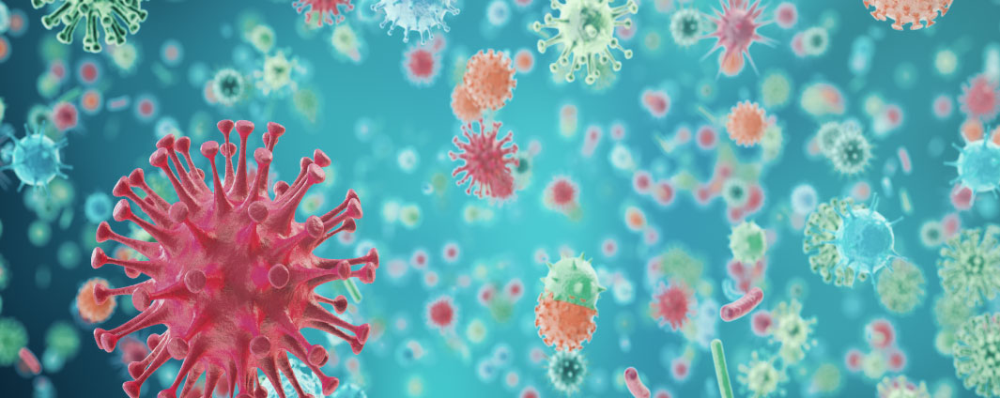


La pandémie de COVID-19 a touché le monde entier et a eu un grand impact sur la santé publique. Pour mieux comprendre cette maladie, de nombreuses données ont été collectées dans les hôpitaux . Dans ce projet, nous allons analyser un jeu de données réel qui contient des informations sur des patients atteints du COVID-19 : âge, sexe, symptômes, traitements, et issue (guérison ou décès).

Le jeu de données utilisé provient de la plateforme Kaggle et est disponible à cette adresse :
👉 https://www.kaggle.com/datasets/einsteindata4u/covid19

 -  #### <font color = bleu> **Objectifs du projet** :</span>


- Explorer un jeu de données médicales lié au COVID-19.
- Identifier les variables biologiques les plus discriminantes.
- Visualiser les relations entre les variables.
- Comprendre les profils cliniques des patients.
- Préparer les bases pour une future modélisation prédictive.

- #### <font color = bleu>  **Question centrale du projet** :</span>

#### Quelles sont les caractéristiques cliniques, biologiques et virales les plus déterminantes pour distinguer les patients testés positifs au COVID-19 de ceux testés négatifs, et identifier les profils les plus à risque ?

<span style="color:red; font-weight:bold; font-size:22px;"> TABLEAU RÉCAPITULATIF DU PROJET D’EXPLORATION DES DONNÉES </span>

|  **Étape** |  **Fonctions / Méthodes utilisées** |  **Objectif / Description** |
|-------------|----------------------------------------|-------------------------------|
| **1. Importation des bibliothèques** | `import numpy as np`, `import pandas as pd`, `import matplotlib.pyplot as plt`, `import seaborn as sns`, `import missingno as msno`, `from scipy.stats import ttest_ind`, `from sklearn.preprocessing import StandardScaler` | Importer les bibliothèques nécessaires à l'analyse, la visualisation, la standardisation et les tests statistiques. |
| **2. Chargement des données** | `pd.read_excel()` | Charger le dataset depuis un fichier Excel local. |
| **3. Copie de sécurité** | `data = df.copy()` | Créer une copie du DataFrame original pour éviter toute perte. |
| **4. Affichage initial des données** | `df.head()` | Aperçu des premières lignes du DataFrame. |
| **5. Informations générales** | `df.info()` | Voir le nombre de lignes, colonnes et types de données. |
| **6. Résumé statistique avancé** | `df.describe()`, `df.select_dtypes()`, `df.isna().sum()`, `df.skew()`, `df.kurtosis()`, `df.mode()` | Statistiques de base + valeurs manquantes, asymétrie, aplatissement, mode. |
| **7. Types de données** | `df.dtypes.value_counts()` | Compter les types de colonnes (`float`, `object`, etc.). |
| **8. Analyse univariée (variables catégoriques)** | `value_counts()`, `plot.pie()`, `for col in df.select_dtypes('object'):` | Étudier les modalités d’une seule variable. |
| **9. Détection des doublons** | `df.duplicated().sum()` | Identifier les lignes répétées. |
| **10. Valeurs manquantes (diagnostic visuel)** | `df.isnull().sum()`, `sns.heatmap(df.isna())`, `msno.matrix()` | Repérer les colonnes contenant des valeurs manquantes. |
| **11. Suppression des colonnes inutiles** | `df = df[df.columns[df.isna().sum()/df.shape[0]<0.9]]` | Éliminer les colonnes avec plus de 90% de valeurs nulles. |
| **12. Visualisation (matplotlib/seaborn)** | `sns.histplot()`, `kde=True`, `countplot()`, `plt.figure()`, `plt.title()`, `plt.xlabel()`, `plt.ylabel()`, `plt.grid()`, `plt.tight_layout()`, `plt.legend()` | Étudier la répartition des variables numériques et comparer selon les groupes. |
| **13. Analyse croisée COVID-19 et autres variables** | `pd.crosstab()`, `sns.heatmap()` | Étudier la relation entre le résultat du test COVID et d'autres variables. |
| **14. Matrice de corrélation (variables biologiques)** | `df.corr()`, `sns.heatmap()` | Identifier les corrélations fortes/faibles entre variables continues. |
| **15. Détection des outliers (valeurs aberrantes)** | Calcul de l'IQR (Q1, Q3, IQR, bornes) | Identifier les variables numériques contenant des valeurs extrêmes. |
| **16. Encodage manuel / préparation** | `df.replace()` | Remplacer manuellement certaines modalités ou valeurs. |
| **17. Standardisation des données** | `StandardScaler().fit_transform()`, `pd.DataFrame()` | Normaliser les variables numériques avant analyse. |
| **18. Test statistique (t-test)** | `ttest_ind()` | Comparer les moyennes entre les groupes (ex: COVID positif vs négatif). |



## <font color = red> **Phase 1 : Préparation et exploration préliminaire :**

- #### <font color = bleu> **Importation et première inspection:**

In [416]:
#importation des bibiotheques :
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 
import missingno as msno
from scipy.stats import ttest_ind

In [417]:
#Chargement des donnees:
df = pd.read_excel('C:\\Users\\4B\\Desktop\\dataset.xlsx') 

In [418]:
# garder un copie neutre sans modification en cas d'urgence 
data= df.copy()

In [419]:
pd.set_option('display.max_row', 111)

In [420]:
df.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,...,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d9e41465789c2b5,15,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [421]:
df.columns

Index(['Patient ID', 'Patient age quantile', 'SARS-Cov-2 exam result',
       'Patient addmited to regular ward (1=yes, 0=no)',
       'Patient addmited to semi-intensive unit (1=yes, 0=no)',
       'Patient addmited to intensive care unit (1=yes, 0=no)', 'Hematocrit',
       'Hemoglobin', 'Platelets', 'Mean platelet volume ',
       ...
       'Hb saturation (arterial blood gases)',
       'pCO2 (arterial blood gas analysis)',
       'Base excess (arterial blood gas analysis)',
       'pH (arterial blood gas analysis)',
       'Total CO2 (arterial blood gas analysis)',
       'HCO3 (arterial blood gas analysis)',
       'pO2 (arterial blood gas analysis)', 'Arteiral Fio2', 'Phosphor',
       'ctO2 (arterial blood gas analysis)'],
      dtype='object', length=111)

In [422]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5644 entries, 0 to 5643
Columns: 111 entries, Patient ID to ctO2 (arterial blood gas analysis)
dtypes: float64(70), int64(4), object(37)
memory usage: 4.8+ MB


In [423]:
df.shape #dimensions

(5644, 111)

In [424]:
df.dtypes.value_counts() # types de données

float64    70
object     37
int64       4
Name: count, dtype: int64

In [425]:
df.duplicated().sum() #doublons

np.int64(0)


#### <font color = orange > **Analyse de la Structure des Données:**</font >

- **Dimensions du jeu de données :** 5 644 lignes et 111 colonnes
- **Types de variables :**

    Variables qualitatives : 41

    Variables quantitatives : 70

- **Valeurs dupliquées :**  Aucune valeur dupliquée détectée

- #### <font color = bleu> **Nettoyage et prétraitement:**

In [426]:
df.isnull().sum()   # Détection systématique des valeurs manquantes avec analyse approfondie

Patient ID                                                  0
Patient age quantile                                        0
SARS-Cov-2 exam result                                      0
Patient addmited to regular ward (1=yes, 0=no)              0
Patient addmited to semi-intensive unit (1=yes, 0=no)       0
Patient addmited to intensive care unit (1=yes, 0=no)       0
Hematocrit                                               5041
Hemoglobin                                               5041
Platelets                                                5042
Mean platelet volume                                     5045
Red blood Cells                                          5042
Lymphocytes                                              5042
Mean corpuscular hemoglobin concentration (MCHC)         5042
Leukocytes                                               5042
Basophils                                                5042
Mean corpuscular hemoglobin (MCH)                        5042
Eosinoph

<Axes: >

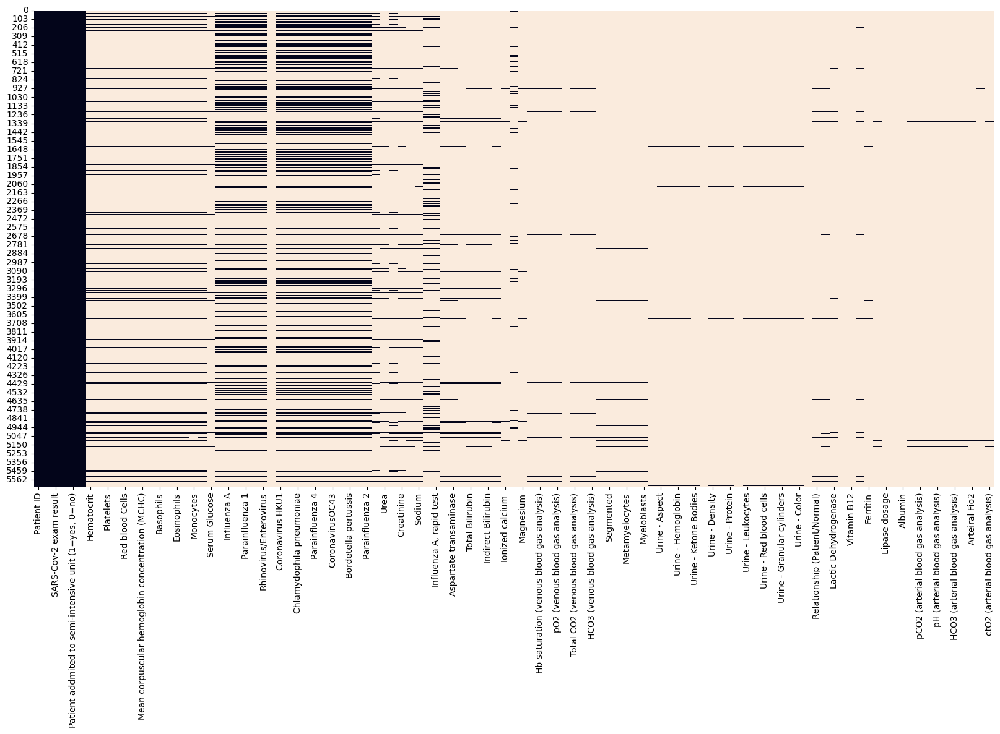

In [427]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(),cbar =  False)

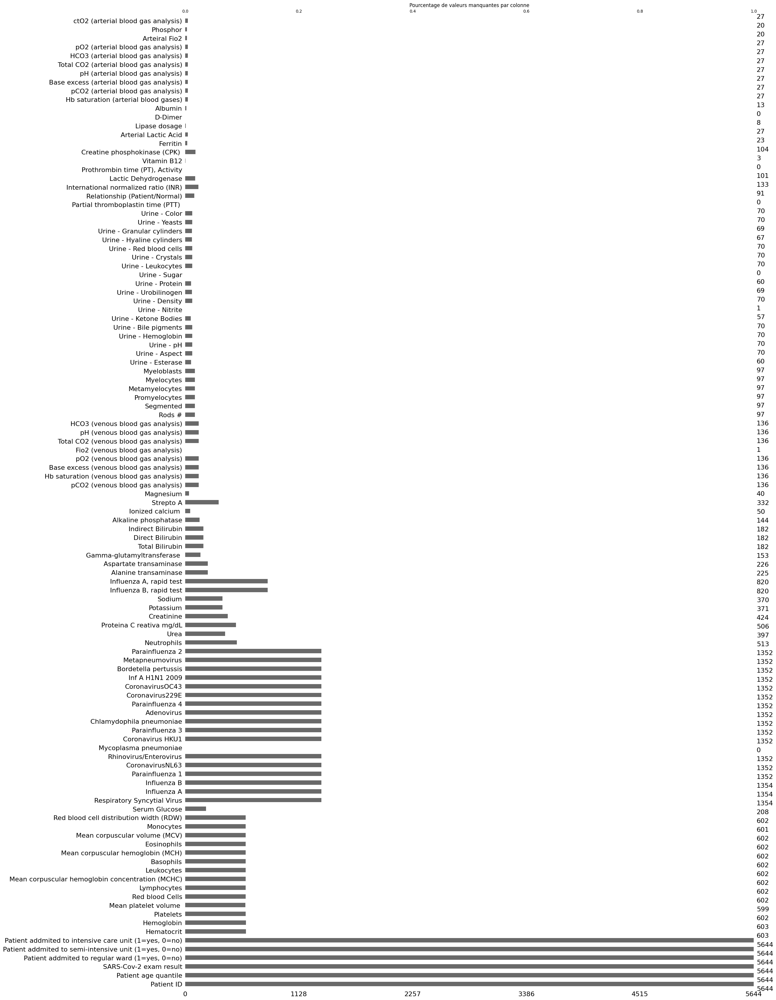

In [428]:
plt.figure(figsize=(10, 6))
msno.bar(df)
plt.title('Pourcentage de valeurs manquantes par colonne')
plt.show()

#### <font color = orange > **Analyse des valeurs manquantes :** </font>
- En explorant les données, nous avons constaté que certaines colonnes contiennent un grand nombre de valeurs manquantes.
- Plusieurs colonnes présentent plus de 90 % de données absentes, ce qui limite leur utilité dans l’analyse
- La moitiédes variables >90% des NAN 
- 2 groupes de donnees 76% -> Test viral / 89% -> taux sanguins 
#### <font color = orange > **Solution choisie pour le Nettoyage :**</font >
- Nous avons décidé de supprimer toutes les colonnes ayant plus de 90 % de valeurs manquantes.
- Cette approche permet d’améliorer la qualité du jeu de données en conservant uniquement les colonnes les plus informatives.

In [429]:
(df.isna().sum()/df.shape[0]).sort_values(ascending=True)# explication de choix de supprission 

Patient ID                                               0.000000
Patient age quantile                                     0.000000
SARS-Cov-2 exam result                                   0.000000
Patient addmited to regular ward (1=yes, 0=no)           0.000000
Patient addmited to semi-intensive unit (1=yes, 0=no)    0.000000
Patient addmited to intensive care unit (1=yes, 0=no)    0.000000
Influenza B                                              0.760099
Influenza A                                              0.760099
Respiratory Syncytial Virus                              0.760099
Parainfluenza 1                                          0.760454
Rhinovirus/Enterovirus                                   0.760454
Coronavirus HKU1                                         0.760454
Chlamydophila pneumoniae                                 0.760454
CoronavirusNL63                                          0.760454
Parainfluenza 3                                          0.760454
Adenovirus

In [430]:
df=df[df.columns[df.isna().sum()/df.shape[0]<0.9]]
df.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,...,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d9e41465789c2b5,15,negative,0,0,0,NaN,NaN,NaN,NaN,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN


<Axes: >

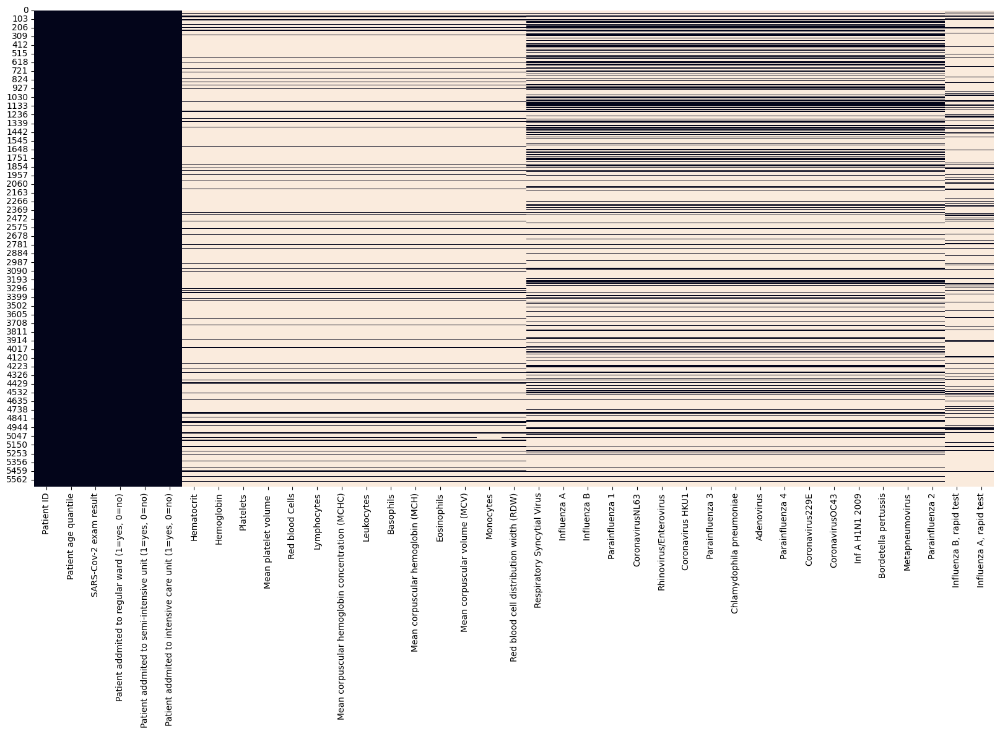

In [431]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(),cbar =  False)

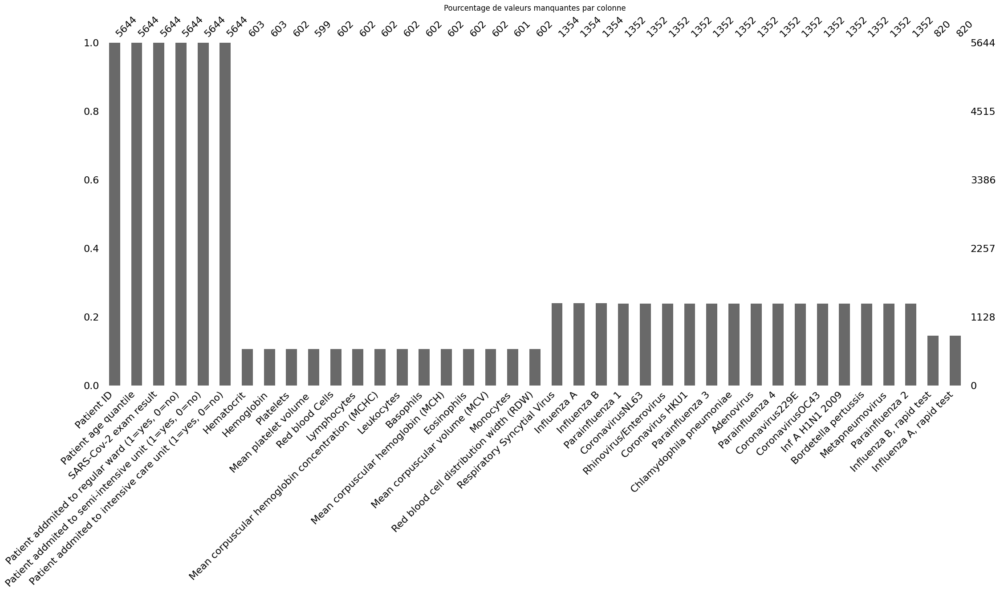

In [432]:
plt.figure(figsize=(10, 6))
msno.bar(df)
plt.title('Pourcentage de valeurs manquantes par colonne')
plt.show()

In [433]:
df.describe()

,Patient age quantile,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW)
count,5644.000000,5644.000000,5644.000000,5644.000000,6.030000e+02,6.030000e+02,6.020000e+02,5.990000e+02,6.020000e+02,6.020000e+02,6.020000e+02,6.020000e+02,6.020000e+02,6.020000e+02,6.020000e+02,6.020000e+02,6.010000e+02,6.020000e+02
mean,9.318391,0.013997,0.008859,0.007264,-2.186214e-09,-1.601319e-08,-3.535004e-10,7.438142e-09,8.424447e-09,-7.866736e-09,1.014863e-09,6.215833e-09,-6.633739e-09,-3.453010e-09,7.206147e-09,-4.155369e-09,-3.220114e-09,1.020433e-08
std,5.777903,0.117489,0.093713,0.084929,1.000830e+00,1.000830e+00,1.000832e+00,1.000836e+00,1.000832e+00,1.000832e+00,1.000832e+00,1.000832e+00,1.000832e+00,1.000832e+00,1.000832e+00,1.000832e+00,1.000833e+00,1.000832e+00
min,0.000000,0.000000,0.000000,0.000000,-4.501420e+00,-4.345603e+00,-2.552426e+00,-2.457575e+00,-3.970608e+00,-1.865070e+00,-5.431808e+00,-2.020303e+00,-1.140144e+00,-5.937604e+00,-8.355077e-01,-5.101581e+00,-2.163721e+00,-1.598094e+00
25%,4.000000,0.000000,0.000000,0.000000,-5.188074e-01,-5.862439e-01,-6.053457e-01,-6.624832e-01,-5.679496e-01,-7.307069e-01,-5.524761e-01,-6.372547e-01,-5.292256e-01,-5.013556e-01,-6.669502e-01,-5.148128e-01,-6.141920e-01,-6.250727e-01
50%,9.000000,0.000000,0.000000,0.000000,5.340703e-02,4.031596e-02,-1.217160e-01,-1.015171e-01,1.385207e-02,-1.426696e-02,-5.458523e-02,-2.128790e-01,-2.237665e-01,1.259032e-01,-3.298351e-01,6.604462e-02,-1.151911e-01,-1.827903e-01
75%,14.000000,0.000000,0.000000,0.000000,7.171751e-01,7.295320e-01,5.314981e-01,6.838353e-01,6.661759e-01,5.976919e-01,6.424628e-01,4.542955e-01,3.871516e-01,5.963475e-01,3.443949e-01,6.268712e-01,4.888627e-01,3.479481e-01
max,19.000000,1.000000,1.000000,1.000000,2.662704e+00,2.671868e+00,9.532034e+00,3.713052e+00,3.645706e+00,3.764100e+00,3.331071e+00,4.522042e+00,1.107822e+01,4.098546e+00,8.350876e+00,3.410980e+00,4.533397e+00,6.982184e+00


In [434]:
#Identification des valeurs aberrantes avec justification statistique
# Liste des variables numériques
numerical_columns = df.select_dtypes(include=[np.number]).columns

# Détection des variables avec outliers selon la règle des 1.5 IQR
outlier_vars = []

for col in numerical_columns:
    data = df[col].dropna()
    if len(data) == 0:
        continue
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = data[(data < lower) | (data > upper)]
    if len(outliers) > 0:
        outlier_vars.append(col)

print("Variables contenant des outliers :")
for var in outlier_vars:
    print("—",var)
   

Variables contenant des outliers :
— Patient addmited to regular ward (1=yes, 0=no)
— Patient addmited to semi-intensive unit (1=yes, 0=no)
— Patient addmited to intensive care unit (1=yes, 0=no)
— Hematocrit
— Hemoglobin
— Platelets
— Mean platelet volume 
— Red blood Cells
— Lymphocytes
— Mean corpuscular hemoglobin concentration (MCHC)
— Leukocytes
— Basophils
— Mean corpuscular hemoglobin (MCH)
— Eosinophils
— Mean corpuscular volume (MCV)
— Monocytes
— Red blood cell distribution width (RDW)


In [435]:
def boxplot_variable(df, variable):
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df[variable])
    plt.title(f'Boxplot de {variable}')
    plt.xlabel(variable)
    plt.grid()
    plt.show()

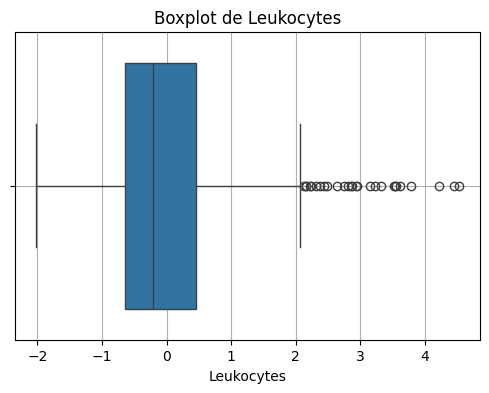

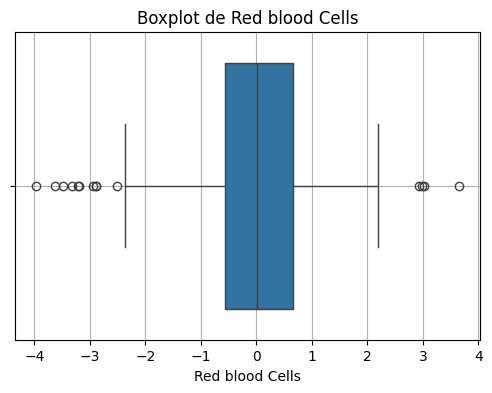

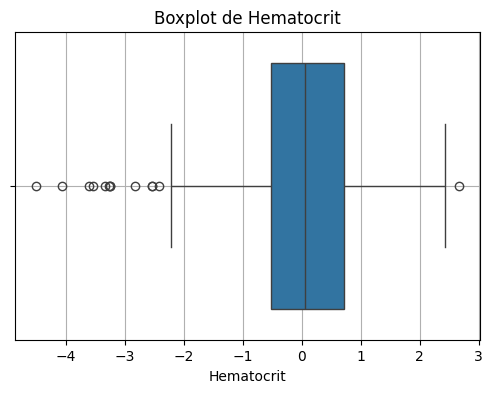

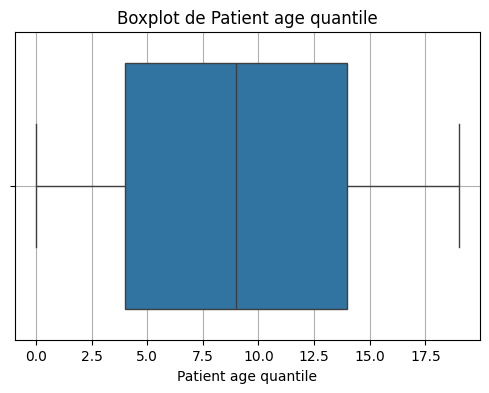

In [436]:
boxplot_variable(df, 'Leukocytes')  
boxplot_variable(df, 'Red blood Cells')
boxplot_variable(df,'Hematocrit')
boxplot_variable(df,'Patient age quantile')

- #### <font color = bleu> **Enrichissement des données:**

In [437]:
##Recodage 
positive_df = df[df['SARS-Cov-2 exam result'] == 'positive']
negative_df = df[df['SARS-Cov-2 exam result'] == 'negative']


In [438]:
df['SARS-Cov-2 exam result'].head()
df['SARS-Cov-2 exam result'].value_counts()


SARS-Cov-2 exam result
negative    5086
positive     558
Name: count, dtype: int64

#### <font color = orange >**Standardisation des données :**</font>

Pour garantir une échelle cohérente entre les variables numériques du dataset, nous avons appliqué une standardisation. Cette étape consiste à centrer les données (moyenne nulle) et à les réduire (écart-type unitaire), ce qui est essentiel pour de nombreuses méthodes d’analyse statistique et d’apprentissage automatique. Avant cela, les valeurs manquantes ont été remplacées par la moyenne de chaque colonne. Le tout a été réalisé à l’aide de StandardScaler de la bibliothèque scikit-learn.

In [439]:
##Standarisation 
from sklearn.preprocessing import StandardScaler

# Étape 1 : Sélection des colonnes numériques
df_num = df.select_dtypes(include='number')

# Étape 2 : Remplacer les valeurs manquantes par la moyenne de chaque colonne
df_num_filled = df_num.fillna(df_num.mean())

# Étape 3 : Standardisation avec StandardScaler
scaler = StandardScaler()
df_scaled_array = scaler.fit_transform(df_num_filled)

# Étape 4 : Créer un nouveau DataFrame standardisé
df_scaled = pd.DataFrame(df_scaled_array, columns=df_num.columns, index=df.index)
df_scaled.head()

,Patient age quantile,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW)
0,0.637244,-0.119146,-0.094542,-0.085542,-6.834462e-19,-2.730592e-17,-1.590253e-17,-8.134857e-18,1.453546e-18,-1.165395e-17,2.304538e-17,1.367419e-17,-7.549458e-18,-1.825573e-17,-8.631611e-18,-3.615288e-17,-1.529068e-17,6.825884e-18
1,1.329598,-0.119146,-0.094542,-0.085542,7.235930e-01,-6.834754e-02,-1.584282e+00,3.277265e-02,3.123296e-01,9.748137e-01,-2.911253e+00,-2.896903e-01,-6.851574e-01,-8.949082e-01,4.538265e+00,5.088695e-01,1.095693e+00,-1.913929e+00
2,-0.228198,-0.119146,-0.094542,-0.085542,-6.834462e-19,-2.730592e-17,-1.590253e-17,-8.134857e-18,1.453546e-18,-1.165395e-17,2.304538e-17,1.367419e-17,-7.549458e-18,-1.825573e-17,-8.631611e-18,-3.615288e-17,-1.529068e-17,6.825884e-18
3,-0.747464,-0.119146,-0.094542,-0.085542,-6.834462e-19,-2.730592e-17,-1.590253e-17,-8.134857e-18,1.453546e-18,-1.165395e-17,2.304538e-17,1.367419e-17,-7.549458e-18,-1.825573e-17,-8.631611e-18,-3.615288e-17,-1.529068e-17,6.825884e-18
4,0.983421,-0.119146,-0.094542,-0.085542,-6.834462e-19,-2.730592e-17,-1.590253e-17,-8.134857e-18,1.453546e-18,-1.165395e-17,2.304538e-17,1.367419e-17,-7.549458e-18,-1.825573e-17,-8.631611e-18,-3.615288e-17,-1.529068e-17,6.825884e-18


## <font color = red> **Phase 2 : Analyse exploratoire systématique:**

- #### <font color = bleu> **Analyse univariée approfondie:**

In [440]:
###Calcul complet des statistiques descriptives
###df.describe().T.round(2)
df_num = df.select_dtypes(include='number')

statistiques = df_num.describe().T
statistiques['missing_values'] = df_num.isna().sum()
statistiques['skewness'] = df_num.skew()
statistiques['kurtosis'] = df_num.kurtosis()
statistiques['mode'] = df_num.mode().iloc[0]

# Arrondir pour lisibilité
statistiques = statistiques.round(2)

# Afficher
statistiques.head(10)

,count,mean,std,min,25%,50%,75%,max,missing_values,skewness,kurtosis,mode
Patient age quantile,5644.0,9.32,5.78,0.00,4.00,9.00,14.00,19.00,0,0.03,-1.21,11.00
"Patient addmited to regular ward (1=yes, 0=no)",5644.0,0.01,0.12,0.00,0.00,0.00,0.00,1.00,0,8.28,66.52,0.00
"Patient addmited to semi-intensive unit (1=yes, 0=no)",5644.0,0.01,0.09,0.00,0.00,0.00,0.00,1.00,0,10.49,107.99,0.00
"Patient addmited to intensive care unit (1=yes, 0=no)",5644.0,0.01,0.08,0.00,0.00,0.00,0.00,1.00,0,11.61,132.78,0.00
Hematocrit,603.0,-0.00,1.00,-4.50,-0.52,0.05,0.72,2.66,5041,-0.73,1.45,-0.47
Hemoglobin,603.0,-0.00,1.00,-4.35,-0.59,0.04,0.73,2.67,5041,-0.63,1.18,-0.46
Platelets,602.0,-0.00,1.00,-2.55,-0.61,-0.12,0.53,9.53,5042,1.80,13.49,-0.45
Mean platelet volume,599.0,0.00,1.00,-2.46,-0.66,-0.10,0.68,3.71,5045,0.42,-0.01,-0.55
Red blood Cells,602.0,0.00,1.00,-3.97,-0.57,0.01,0.67,3.65,5042,-0.37,1.28,-0.57
Lymphocytes,602.0,-0.00,1.00,-1.87,-0.73,-0.01,0.60,3.76,5042,0.48,0.16,-0.50


#### <font color = orange >**Les hypotheses :**</font>
- La majorité des patients ne sont pas admis en soins intensifs, ce qui montre un fort déséquilibre dans les variables d’admission.
- Les variables d’admission présentent une forte asymétrie et une distribution très concentrée autour de 0.
- Les données biologiques comportent de nombreuses valeurs manquantes, ce qui suggère qu’elles n’ont pas été relevées pour tous les patients.
- Certaines variables semblent déjà standardisées (moyenne proche de 0, écart-type proche de 1).
- La variabilité observée dans les valeurs biologiques indique des profils cliniques très différents parmi les patients.

In [441]:
#Visualisation adaptée des distributions (densité, histogrammes, violin plots)
df.dtypes.value_counts()

object     21
float64    14
int64       4
Name: count, dtype: int64

<Axes: ylabel='count'>

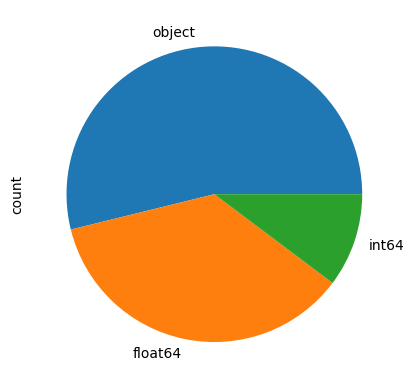

In [442]:
df.dtypes.value_counts().plot.pie()

<Axes: xlabel='Patient age quantile', ylabel='Count'>

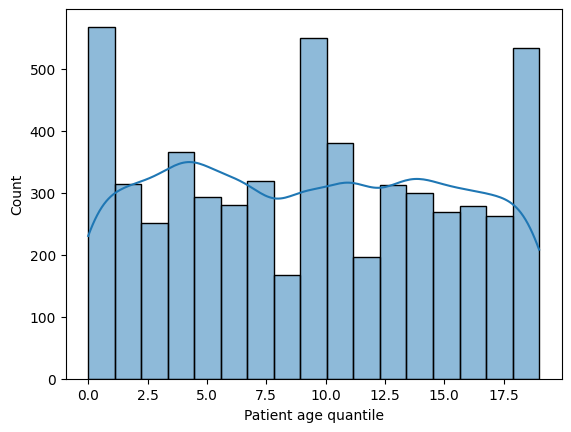

In [472]:
sns.histplot(df['Patient age quantile'] , kde= True)

In [444]:
for col in df.select_dtypes('object'):
    print(f'{col:-<50}{df[col].unique()}')

Patient ID----------------------------------------['44477f75e8169d2' '126e9dd13932f68' 'a46b4402a0e5696' ...
 '5c57d6037fe266d' 'c20c44766f28291' '2697fdccbfeb7f7']
SARS-Cov-2 exam result----------------------------['negative' 'positive']
Respiratory Syncytial Virus-----------------------[nan 'not_detected' 'detected']
Influenza A---------------------------------------[nan 'not_detected' 'detected']
Influenza B---------------------------------------[nan 'not_detected' 'detected']
Parainfluenza 1-----------------------------------[nan 'not_detected' 'detected']
CoronavirusNL63-----------------------------------[nan 'not_detected' 'detected']
Rhinovirus/Enterovirus----------------------------[nan 'detected' 'not_detected']
Coronavirus HKU1----------------------------------[nan 'not_detected' 'detected']
Parainfluenza 3-----------------------------------[nan 'not_detected' 'detected']
Chlamydophila pneumoniae--------------------------[nan 'not_detected' 'detected']
Adenovirus-------------

#### <font color = orange >**justifier le choix du diagrammes :**</font>

- **La visualisation des variables qualitatives nominales ou ordinales :**
Le diagramme de camembert est utilisé car il permet de représenter facilement la répartition des différentes catégories d’une variable. Il est adapté pour observer les proportions et repérer les modalités dominantes.

- **La visualisation des variables quantitatives :**
Nous avons opté pour des distributions en bâton (barres verticales) afin de visualiser la fréquence des différentes valeurs ou des classes de valeurs. Cela permet d’avoir une vue claire sur la répartition, les tendances et les éventuelles anomalies.


C:\Users\4B\AppData\Local\Temp\ipykernel_8260\2413286044.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


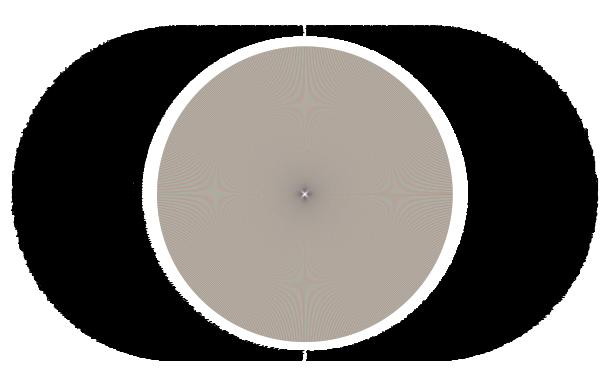

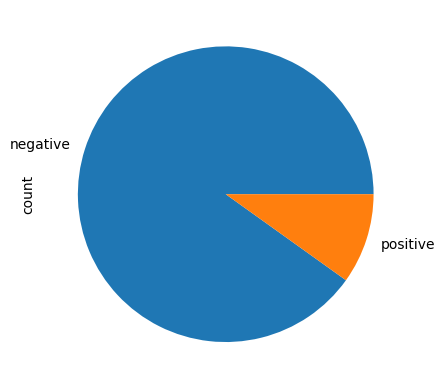

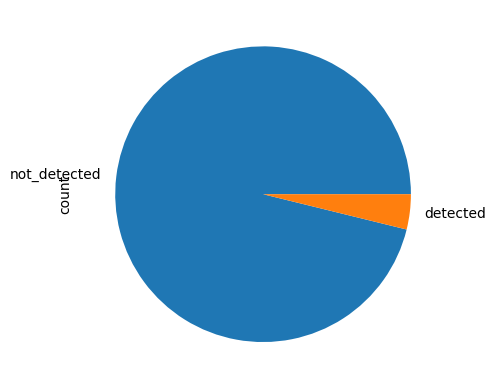

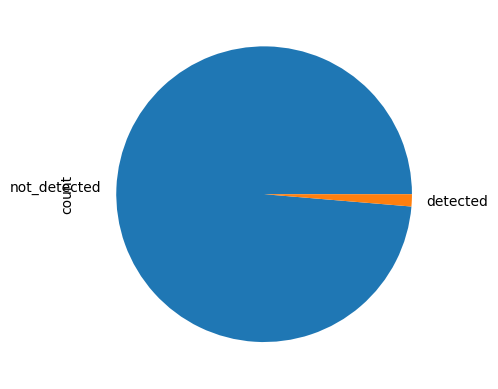

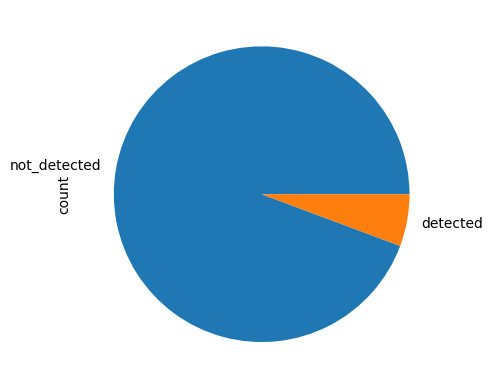

...

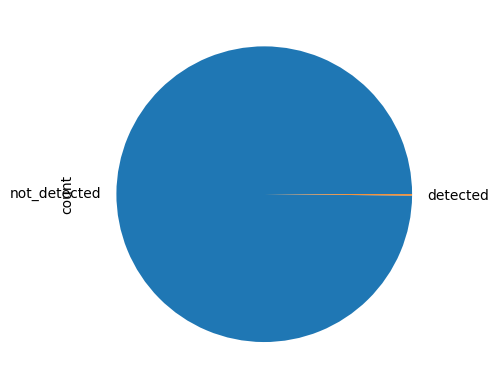

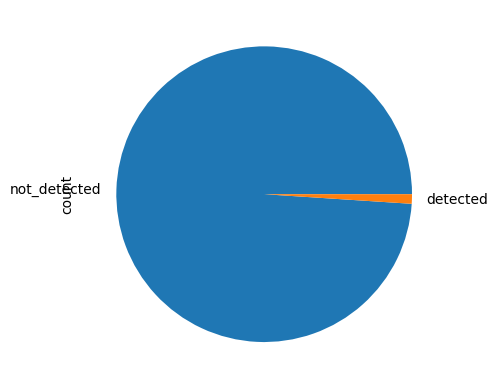

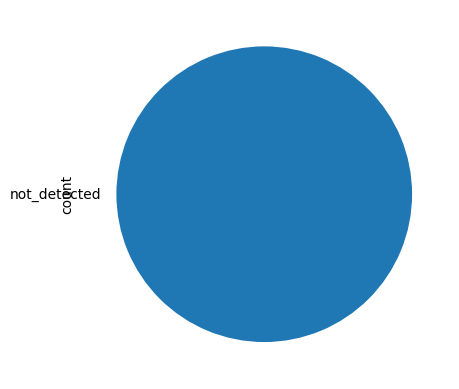

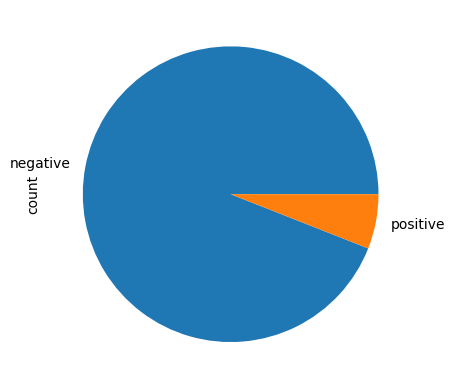

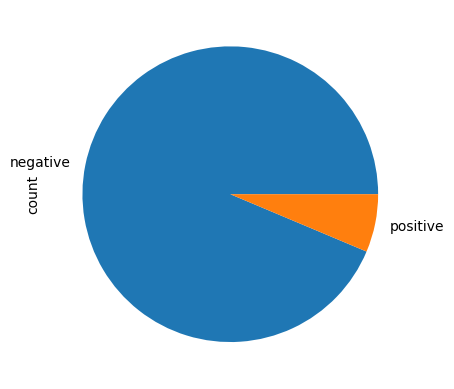

In [445]:
for col in df.select_dtypes('object'):
    plt.figure()
    df[col].value_counts().plot.pie()

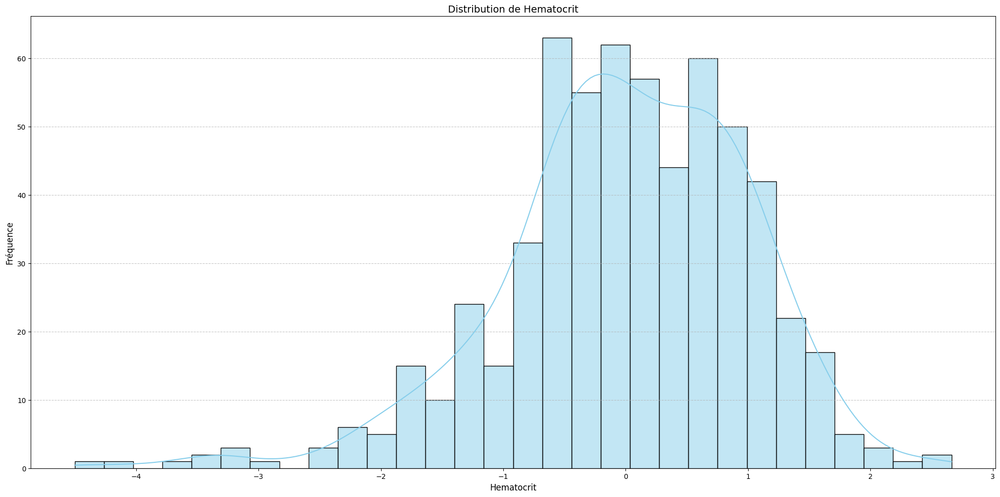

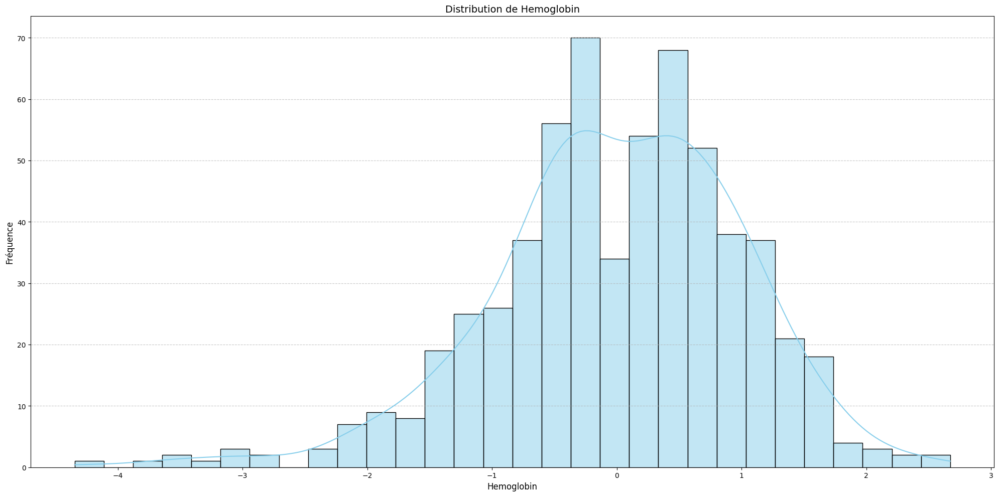

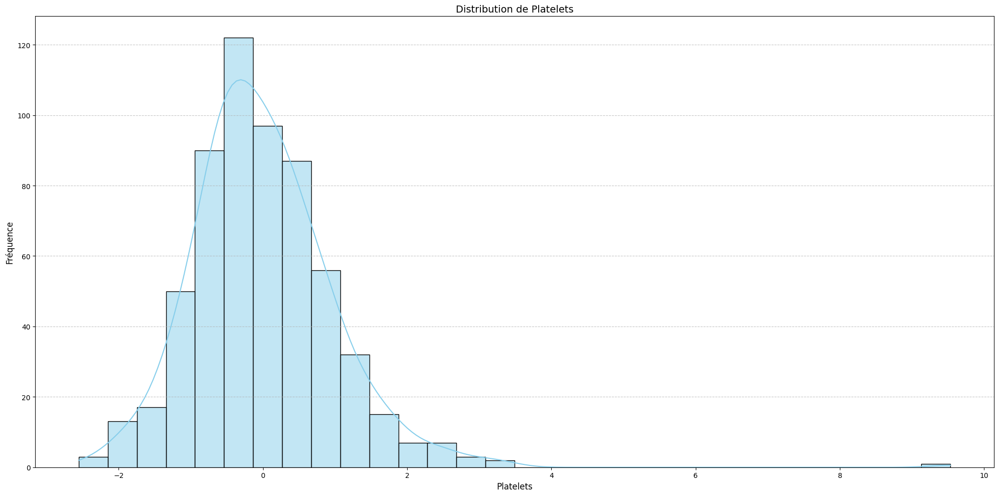

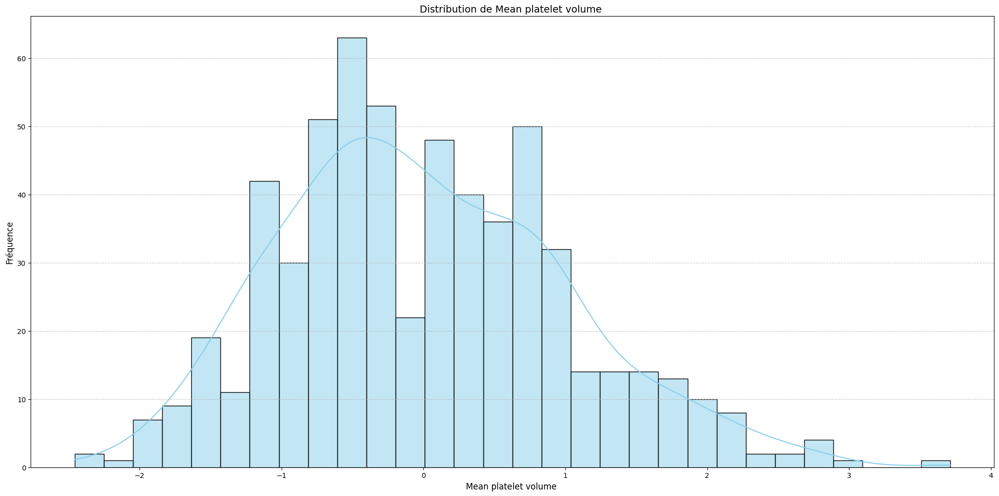

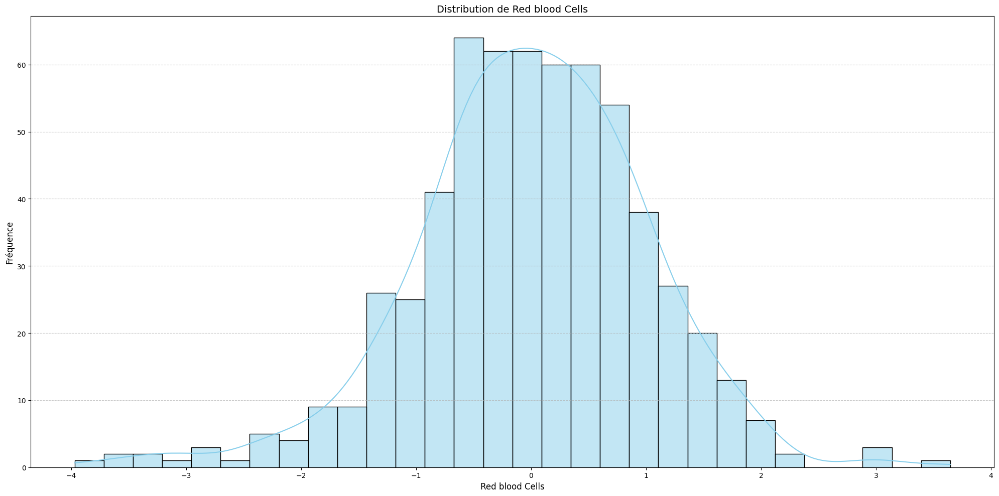

...

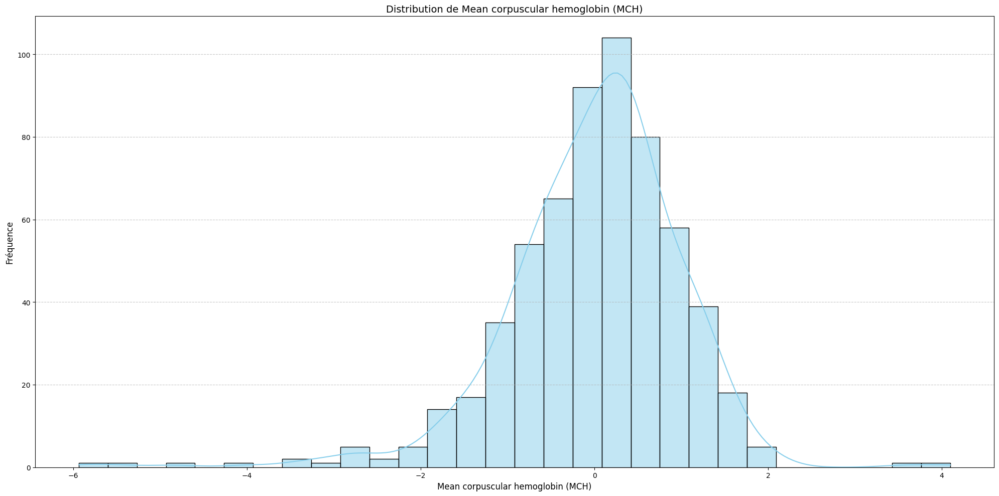

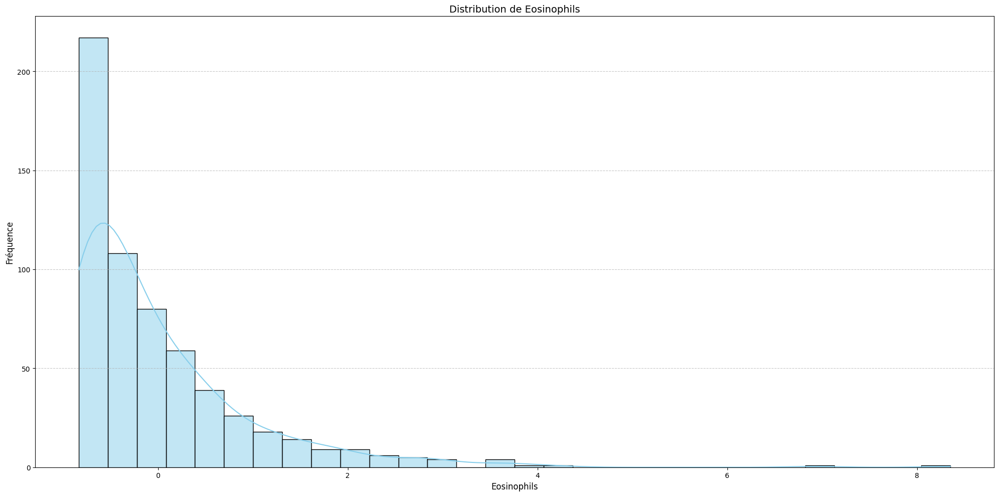

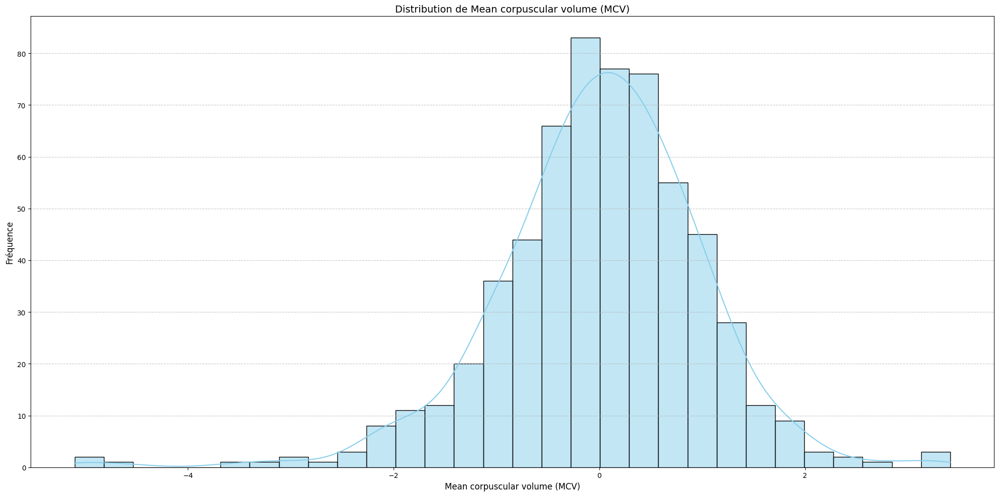

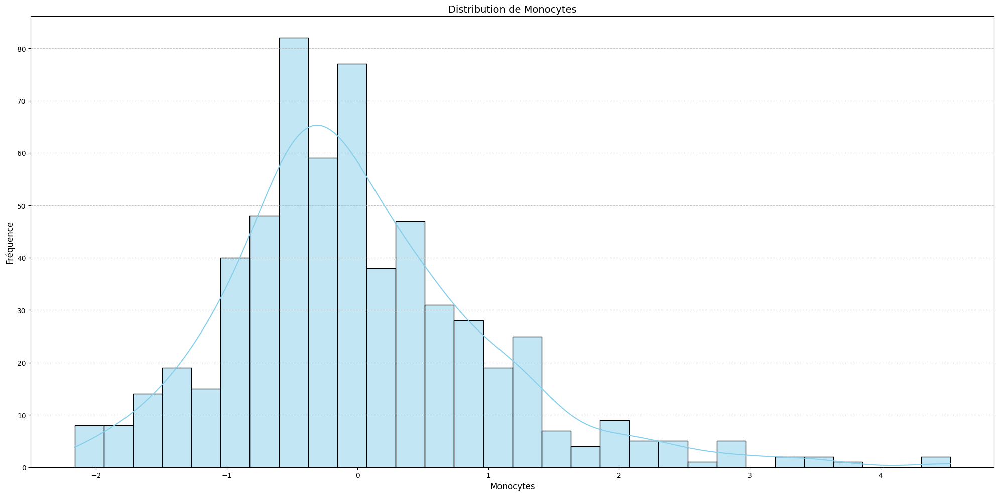

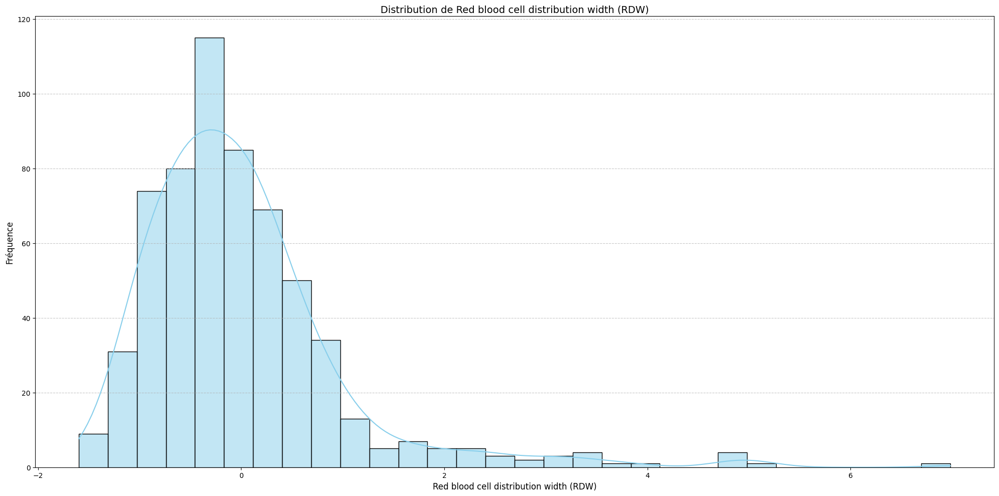

In [446]:
for col in df.select_dtypes('float'):
    plt.figure(figsize=(20, 10))  
    sns.histplot(data=df , x=col, kde=True, bins=30, color='skyblue')
    plt.title(f"Distribution de {col}", fontsize=14)  
    plt.xlabel(col, fontsize=12)  
    plt.ylabel("Fréquence", fontsize=12)  
    plt.grid(axis='y', linestyle='--', alpha=0.7)  
    plt.tight_layout()
    plt.show()


 <font color = orange >**Hypothèse 2 :**</font>

"Les variables d’admission présentent une forte asymétrie et une distribution très concentrée autour de 0"

<font color = orange >**Vérification :**</font>

- Les histogrammes des variables d’admission (ex : Eosinophils, Monocytes) montrent :
- Une queue étendue vers la droite → asymétrie positive
- Un pic centré vers 0, surtout pour les globules blancs.

<font color = orange >**Hypothèse 4 :**</font>

"Certaines variables semblent déjà standardisées (moyenne ≈ 0, écart-type ≈ 1)"

<font color = orange >**Vérification :**</font>

- Sur les histogrammes, certaines courbes (ex : Red Blood Cells, Hemoglobin) montrent une forme très régulière centrée.
 
<font color = orange >**Hypothèse 5 :**</font>

"La variabilité observée dans les valeurs biologiques indique des profils cliniques très différents"

<font color = orange >**Vérification :**</font>

- Les histogrammes de variables comme :
Lymphocytes, Platelets, Eosinophils
→ montrent des distributions variées, avec des formes et étalements différents.






- #### <font color = bleu> **Analyse bivariée exhaustive:**

In [447]:
positive_df = df[df['SARS-Cov-2 exam result'] == 'positive']#Crée un sous-ensemble positive_df avec uniquement les patients COVID+.
negative_df = df[df['SARS-Cov-2 exam result'] == 'negative']#Crée un sous-ensemble negative_df avec uniquement les patients COVID−.

- **blood columns :**  Sélectionne les colonnes biologiques (comme Leukocytes, Hematocrit…), qui ont 88 à 90% de NaN.

- **Viral columns :**  Sélectionne les colonnes virales (comme Influenza A, Rhinovirus…), qui ont 75 à 88% de NaN.


In [448]:
missing_rate = df.isna().sum() / df.shape[0]

blood_columns = missing_rate.index[(missing_rate < 0.9) & (missing_rate > 0.88)]
viral_columns = missing_rate.index[(missing_rate < 0.88) & (missing_rate > 0.75)]

#### <font color = orange >**Hypothèse initiale:**</font>

 "Les taux de Monocytes, Platelets, Leukocytes semblent liés au covid-19 -> hypothèse à tester"

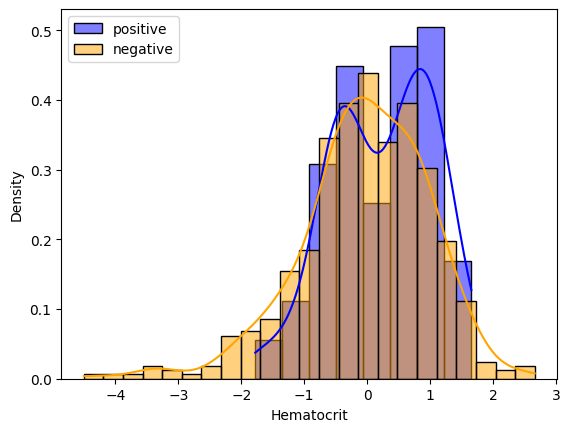

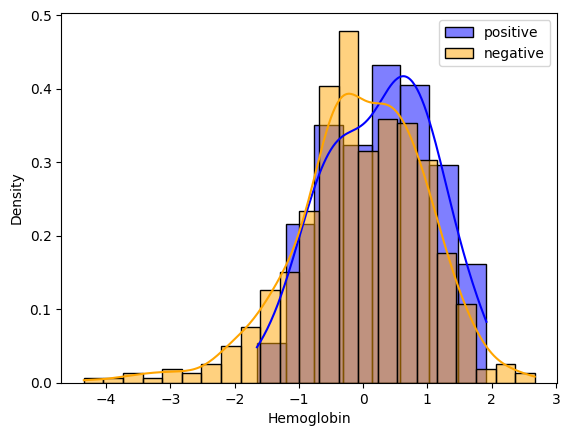

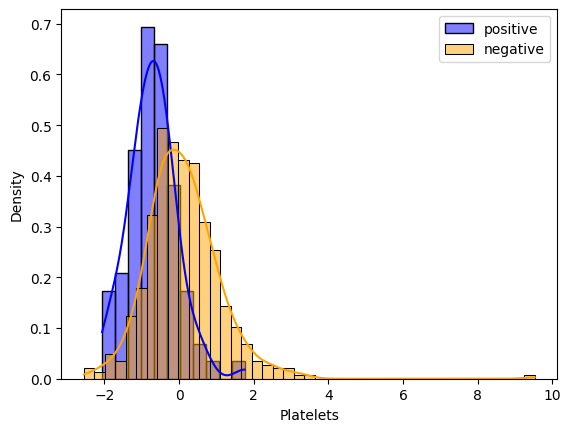

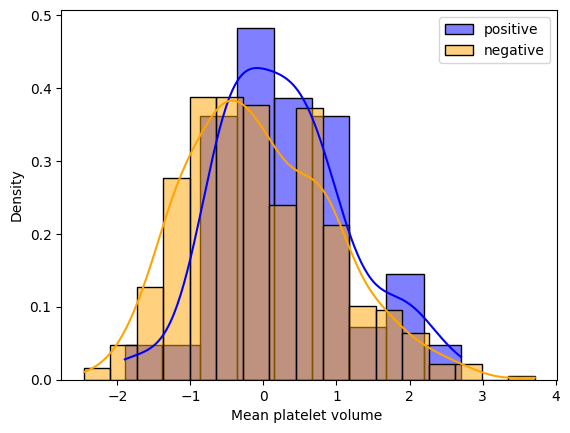

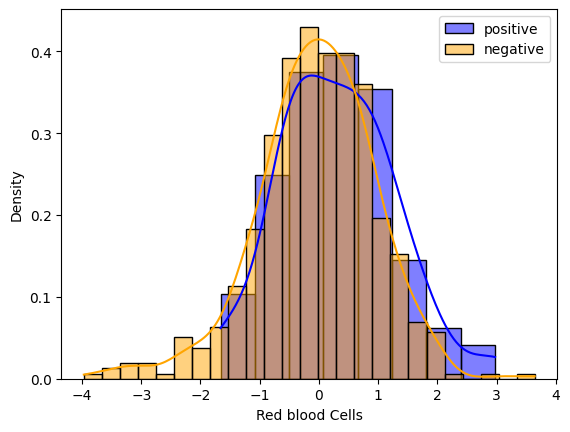

...

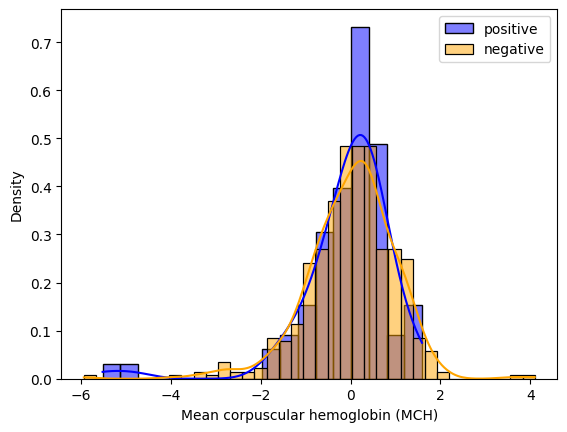

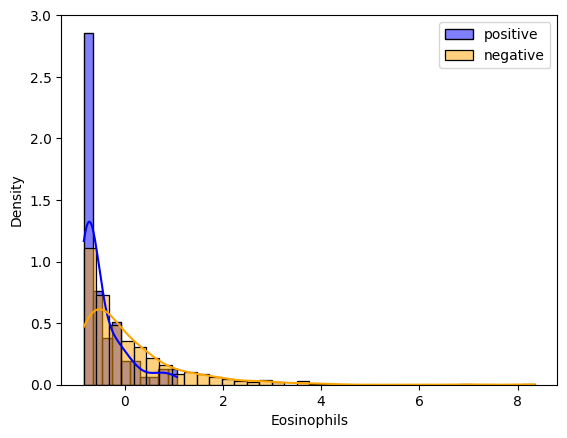

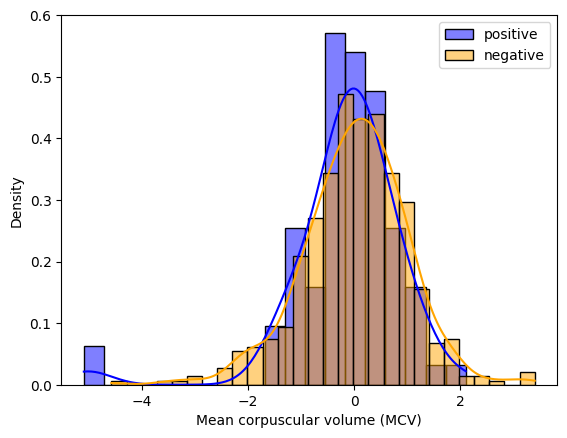

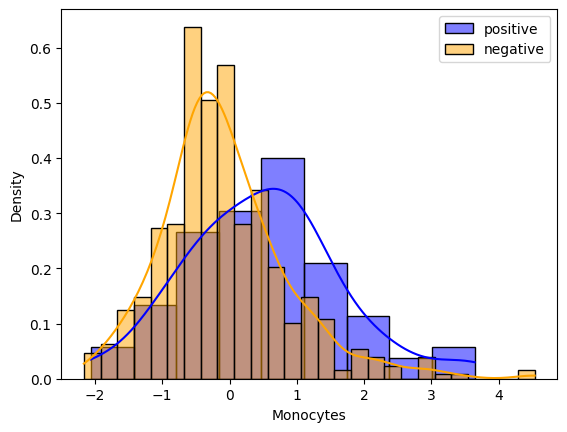

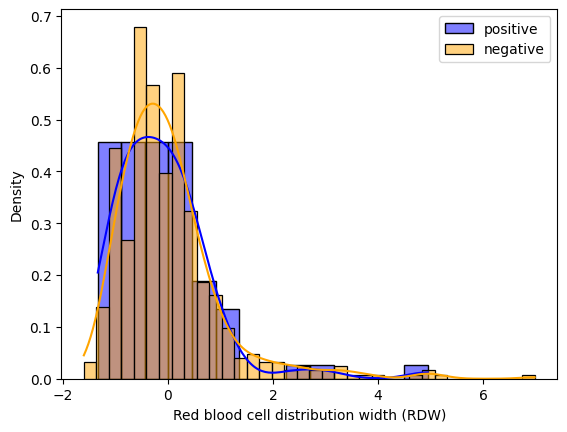

In [449]:
for col in blood_columns:
    plt.figure()
    sns.histplot(data=positive_df, x=col, label='positive', kde=True, color="blue", stat="density", common_norm=False)
    sns.histplot(data=negative_df, x=col, label='negative', kde=True, color="orange", stat="density", common_norm=False)
    plt.legend()

#### <font color = orange >**Interpretation et Verification :**</font>

Certains biomarqueurs sanguins présentent des variations significatives chez les patients testés positifs au COVID-19.
En particulier, des taux anormaux de leucocytes (globules blancs), monocytes et plaquettes pourraient refléter une réponse immunitaire spécifique à l’infection virale.
Cette hypothèse peut être testée par une comparaison des distributions (boxplots) entre les groupes COVID+ et COVID−, ainsi que par des tests statistiques (Mann-Whitney ou t-test).

 #### <font color = orange >**Hypothèse initiale :**</font>

"Les individus de faible âge sont très peu contaminés ? -> attention on ne connaît pas l’âge..."


<Axes: xlabel='Patient age quantile', ylabel='count'>

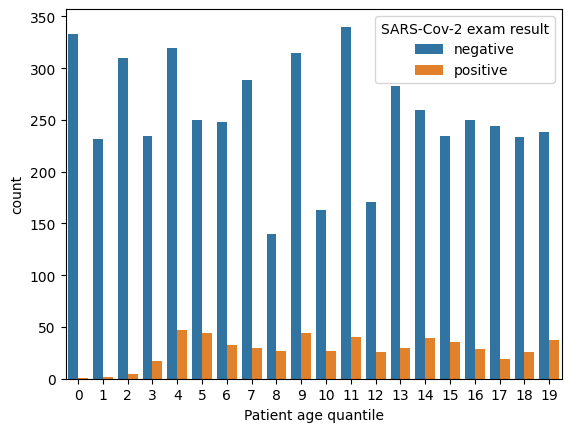

In [450]:
sns.countplot(x='Patient age quantile',hue='SARS-Cov-2 exam result',data=df)

#### <font color = orange >**Interpretation et Verification :**</font>

Les patients appartenant aux classes d’âge les plus jeunes (quantiles faibles) sont moins souvent testés positifs au COVID-19.
Cependant, la variable utilisée (Patient age quantile) est une approximation, et l’interprétation doit être prudente.
En l’absence de dates précises dans le dataset, il est difficile de savoir si les enfants étaient effectivement sous-représentés au moment de la collecte.
Cette variable peut néanmoins être utilisée à des fins de comparaison avec d’autres variables biologiques (ex. : valeurs sanguines selon l’âge).

#### <font color = orange >**Hypothèse initiale :**</font>

"Les doubles maladies sont très rares. Rhinovirus/Enterovirus positif → COVID-19 négatif ? -><font color = bleu>*hypothèse à tester*?


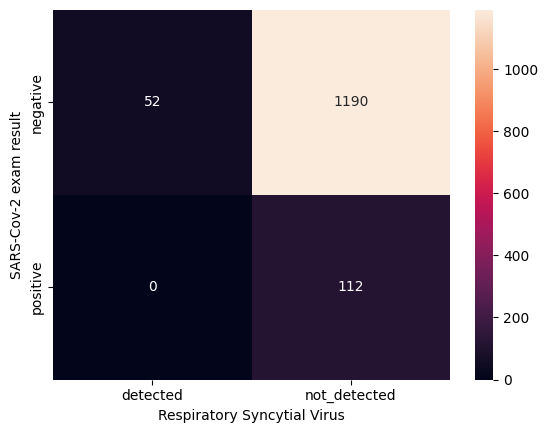

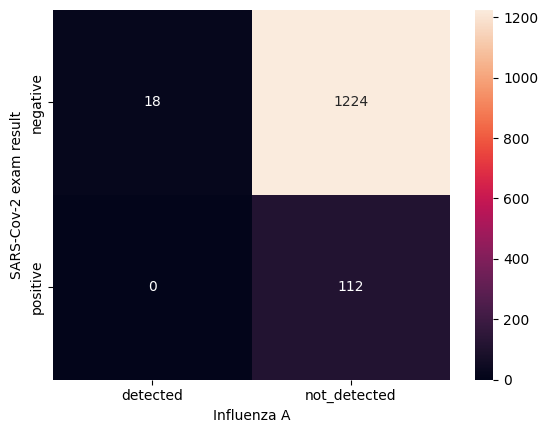

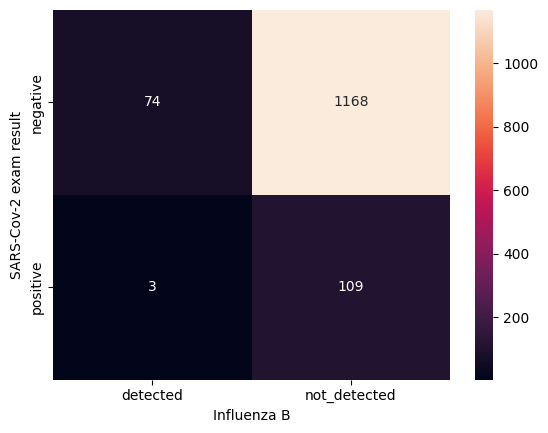

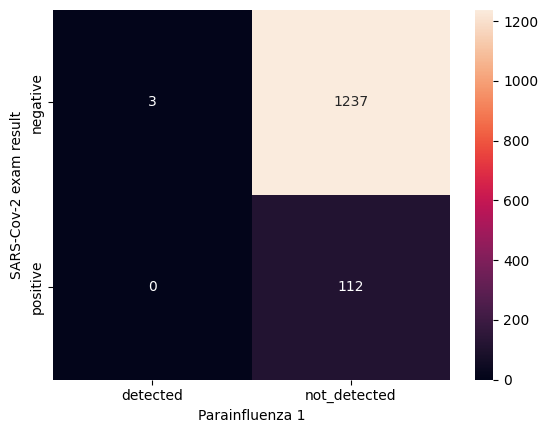

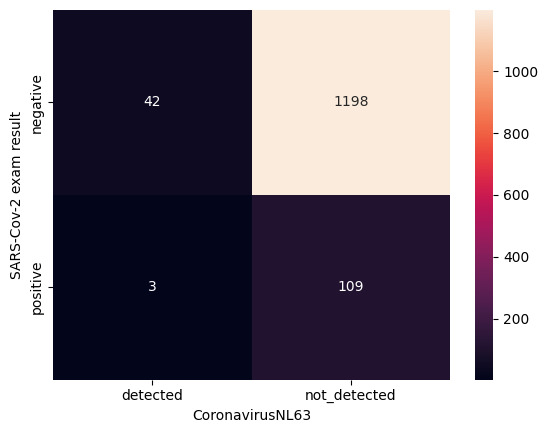

...

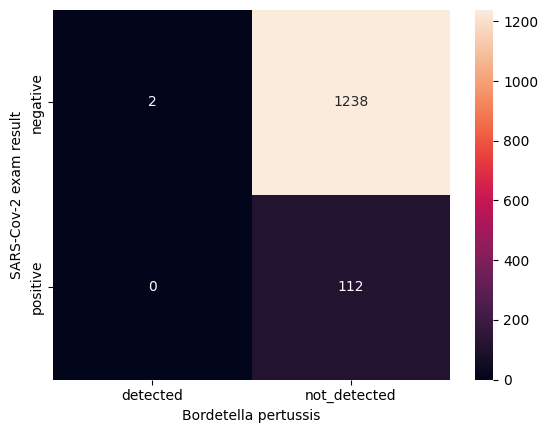

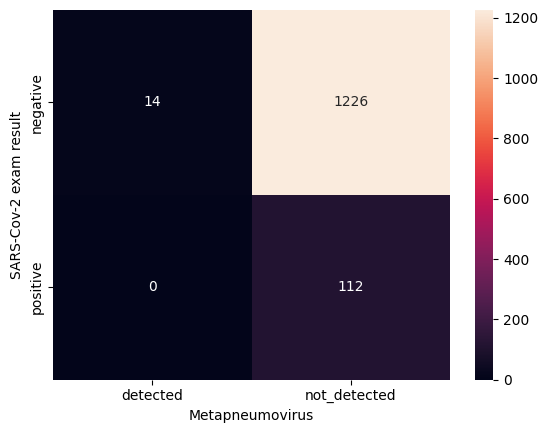

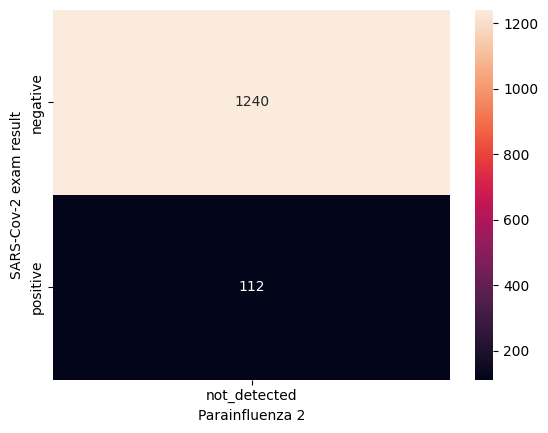

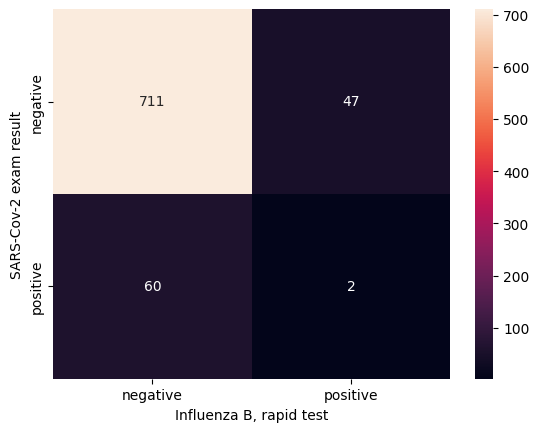

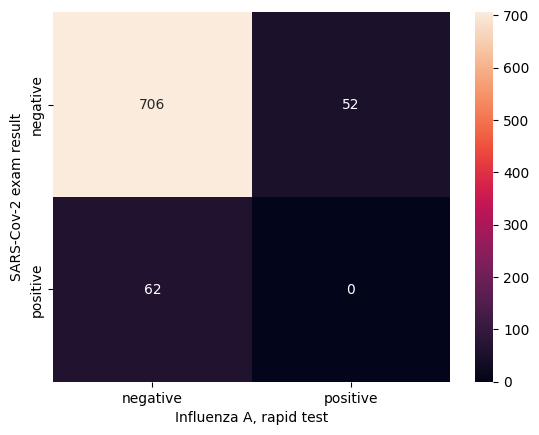

In [451]:
for col in viral_columns:
    plt.figure()
    sns.heatmap(pd.crosstab(df['SARS-Cov-2 exam result'], df[col]), annot=True, fmt='d')

#### <font color = orange >**Interpretation et Verification :**</font>

Les co-infections virales (présence simultanée du COVID-19 et d’un autre virus respiratoire) sont rares dans ce dataset.
En particulier, la détection d’un Rhinovirus ou Enterovirus semble davantage associée aux patients COVID négatifs.
Cela suggère une possible exclusion entre certains virus, ou peut refléter un contexte épidémiologique local (circulation d’un virus non-COVID au moment des tests).
Il est néanmoins biologiquement possible d’être porteur de plusieurs virus à la fois.
Cette hypothèse mérite donc d’être testée statistiquement, et les résultats doivent être interprétés avec prudence.

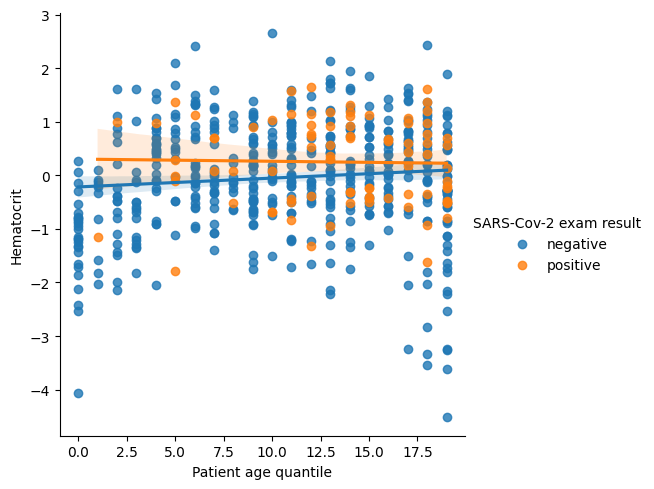

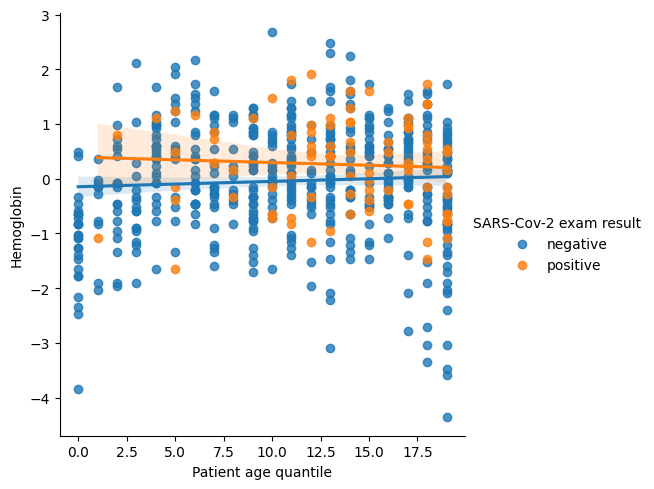

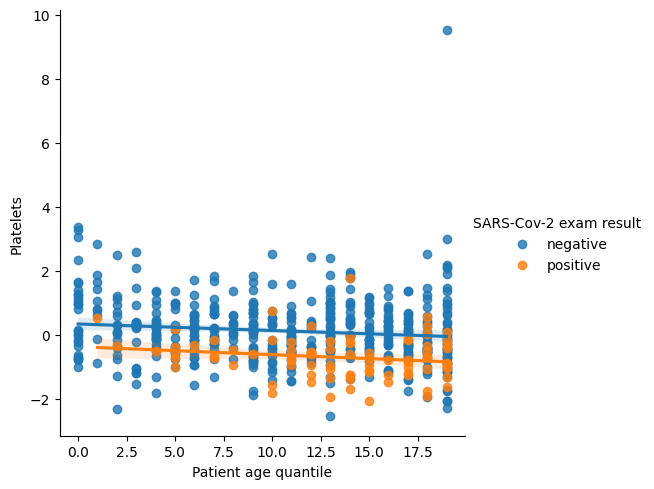

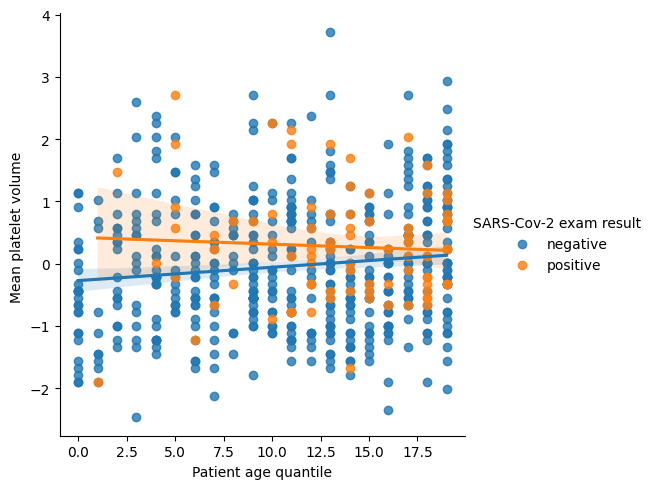

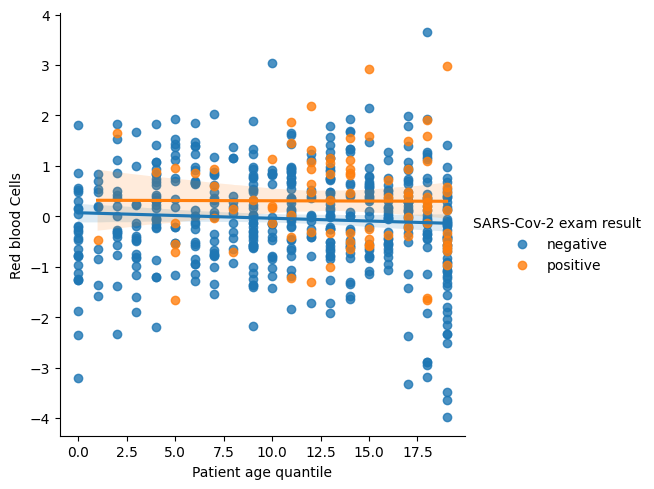

...

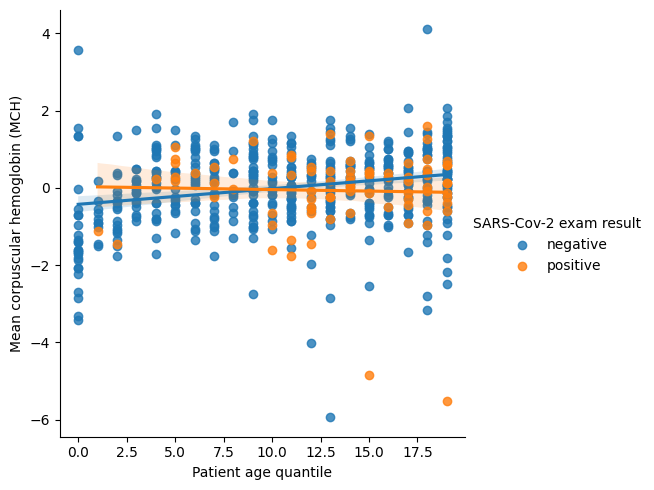

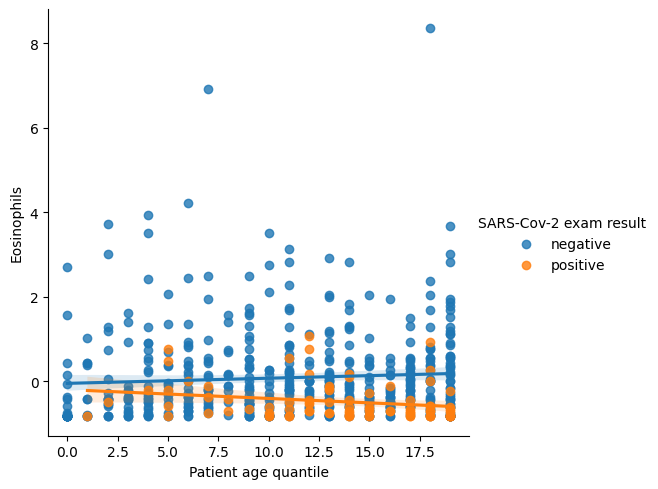

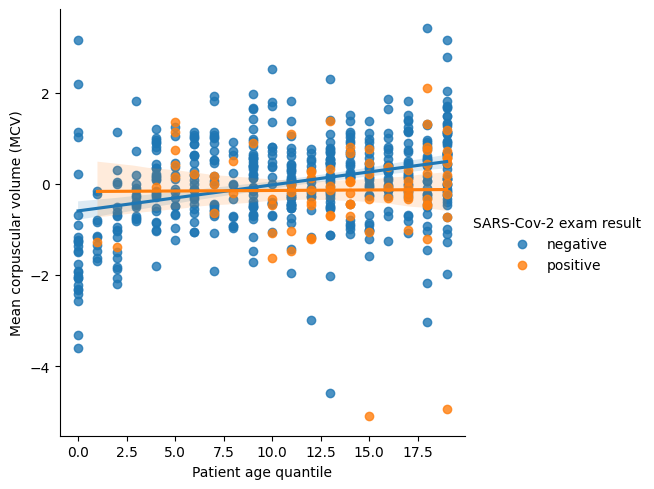

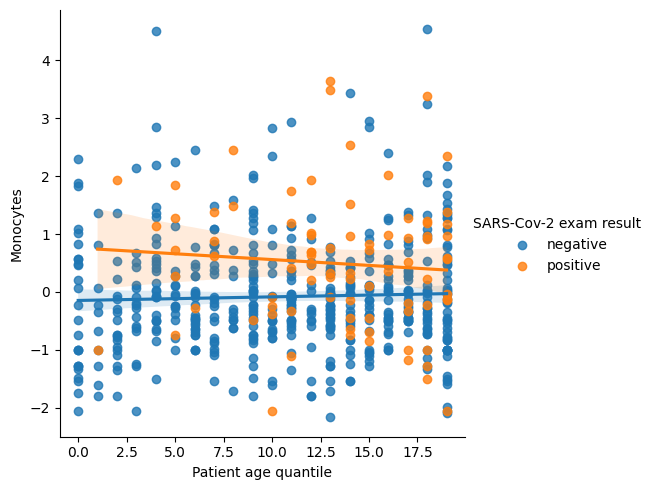

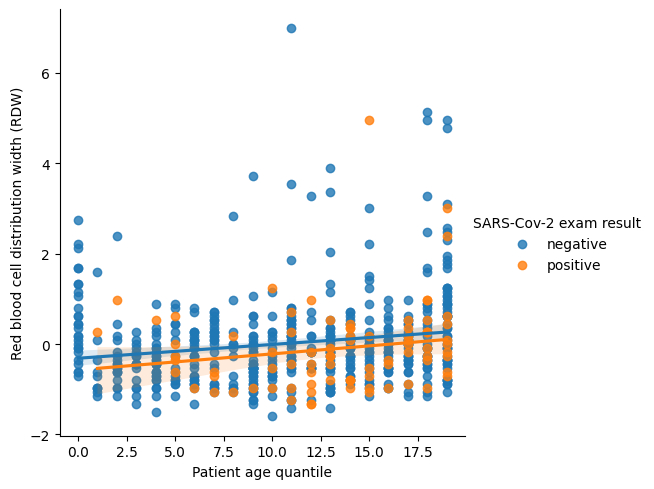

In [452]:
for col in blood_columns:
    sns.lmplot(x='Patient age quantile', y=col, hue='SARS-Cov-2 exam result', data=df)

####  Pour chaque graphique, on observe la tendance entre l’âge et un biomarqueur, séparée en deux groupes (COVID+ et COVID−), grâce à des lignes de régression colorées.

#### <font color = orange >**Comparaison entre COVID+ et COVID− :**</font>

Si les deux lignes sont très proches → pas de différence marquée.
Si elles sont bien séparées → ce marqueur peut aider à différencier les groupes.

#### <font color = orange >**Influence de l’âge :**</font>

Si la pente est forte (montante ou descendante) → le marqueur évolue avec l’âge.
Si la pente est plate → le marqueur est stable quel que soit l’âge.


- #### <font color = bleu> **Analyse multivariée avancée:**

<Axes: >

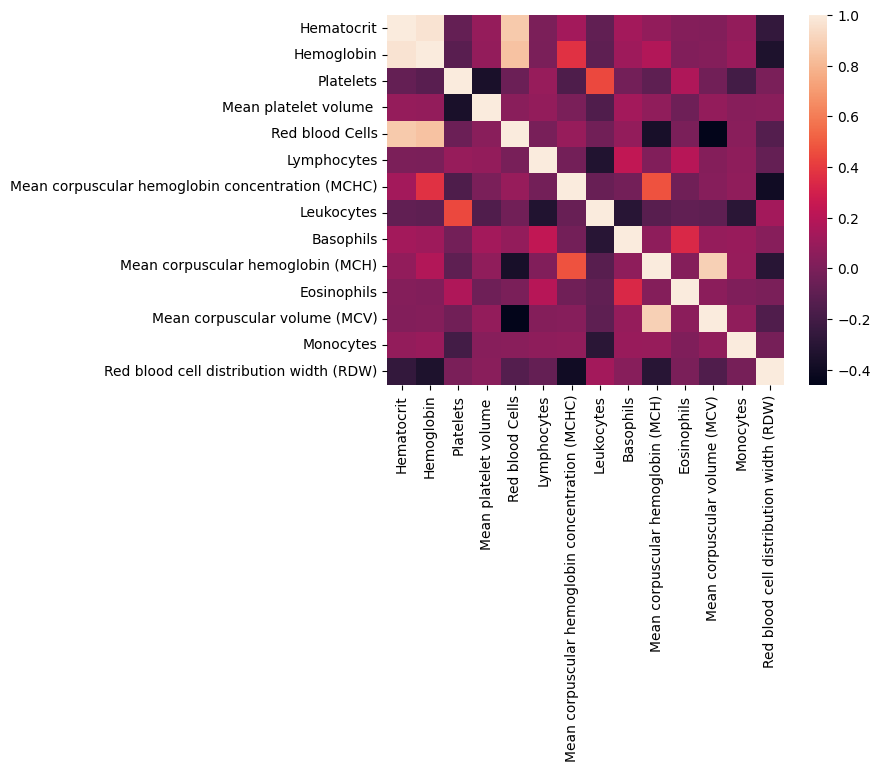

In [453]:
sns.heatmap(df[blood_columns].corr())

 #### <font color = orange >**Lecture :**</font>

- Les couleurs foncées vers le violet/rouge foncé indiquent une forte corrélation positive (proche de +1).

- Les couleurs plus claires ou rosées indiquent une corrélation faible voire négative.

 #### <font color = orange >**Observations possibles :**</font>

- Hematocrit, Hemoglobin et Red Blood Cells semblent fortement corrélés, ce qui est attendu (elles sont liées à la concentration de globules rouges).

- Certaines variables comme Basophils ou Monocytes ont moins de corrélation avec les autres, ce qui peut les rendre utiles pour détecter des effets spécifiques (comme une infection virale).

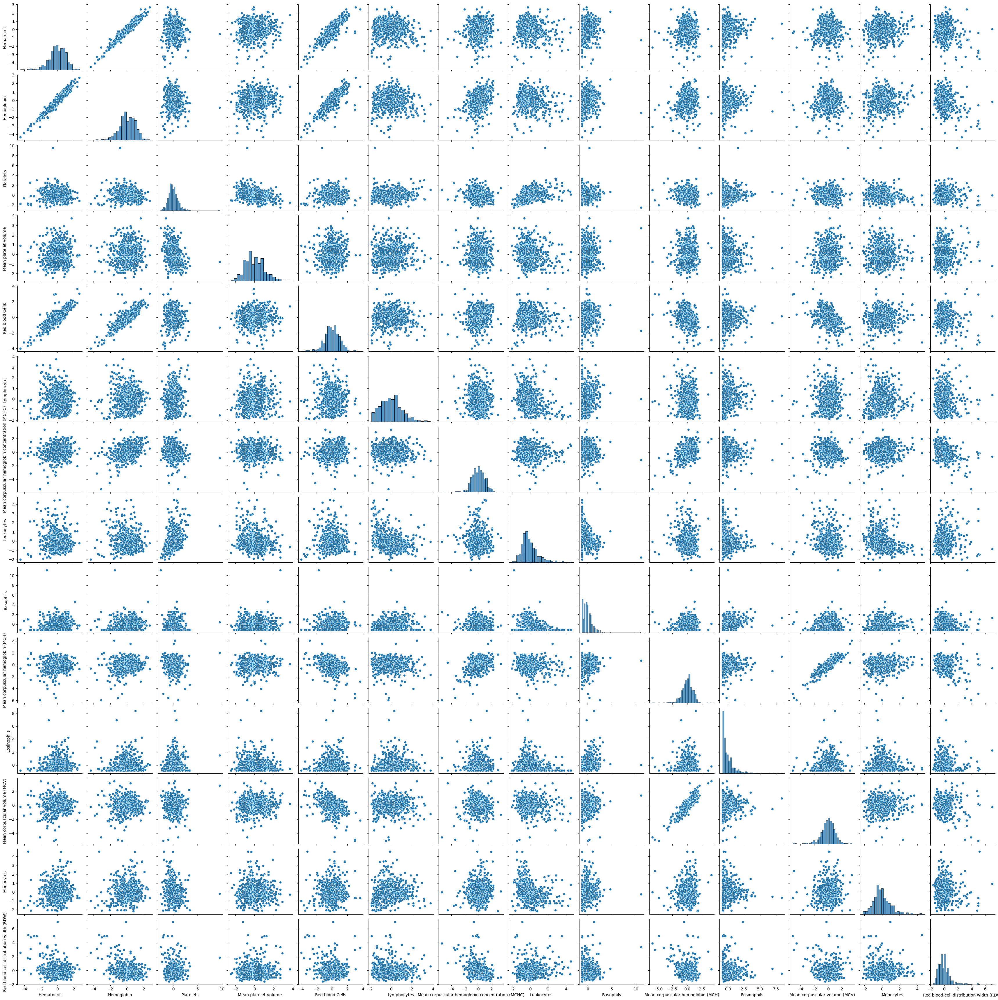

In [454]:
sns.pairplot(df[blood_columns])

 #### <font color = orange >**1. Corrélations visibles :**</font>

Certaines paires de variables sont très corrélées, par exemple : Hematocrit et Hemoglobin (logique, elles sont liées au sang).

D’autres sont plus dispersées, montrant une faible ou aucune corrélation.




 #### <font color = orange >**2. Dispersion générale :**</font>

On observe des groupes de points, parfois très concentrés (données homogènes), parfois très dispersés (variabilité entre patients).

Cela peut révéler des tendances intéressantes, mais ici les couleurs par classe (positif/négatif) n’apparaissent pas — donc on ne voit pas directement l’effet du COVID.



 #### <font color = orange >**3. Distributions sur la diagonale :**</font>

Chaque histogramme montre la distribution d'une variable. Par exemple, certaines variables sont normalement réparties, d'autres très asymétriques (avec des valeurs extrêmes).


In [455]:
df['est_malade'] = (np.sum(df[viral_columns[:-2]] == 'detected', axis=1))  #créer une nouvelle colonne est_malade contenant le nombre total de virus détectés pour chaque patient.

Axes(0.125,0.11;0.775x0.77)


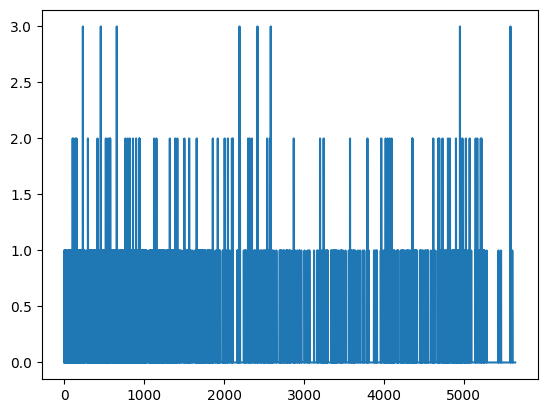

In [456]:
print (df['est_malade'].plot())

 #### <font color = orange >**Visualisation du nombre de virus détectés par patient (est_malade):**</font>

La variable est_malade indique combien de virus ont été détectés chez chaque patient (0, 1, 2 ou plus). Le graphique montre que :

- La majorité des patient n’ont aucun virus détecté, ou un seul virus.
- Les co-infections virales (plus de 1 virus détecté) sont rares.
- Cela confirme que les cas multi-infectés sont marginaux dans ce dataset.




In [457]:
malade_df = df[df['est_malade'] == True]
non_malade_df = df[df['est_malade'] == False]

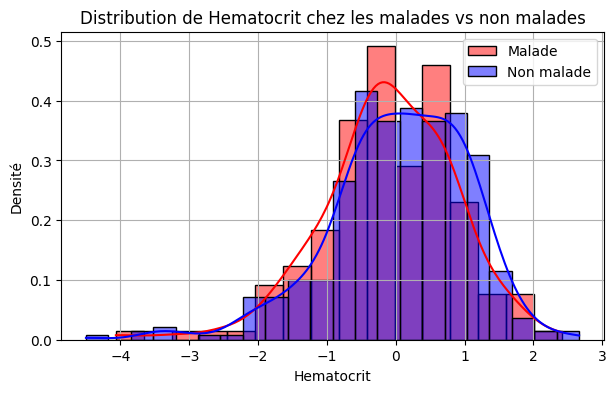

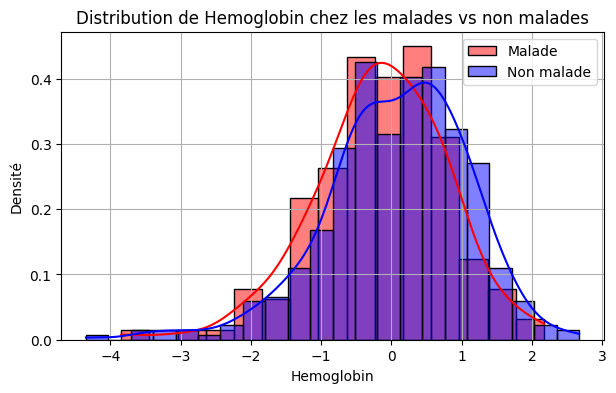

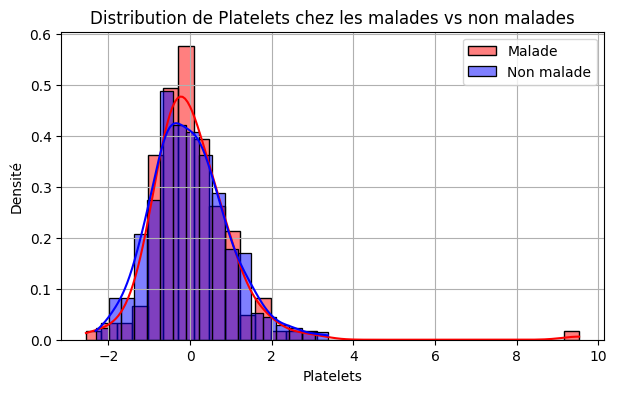

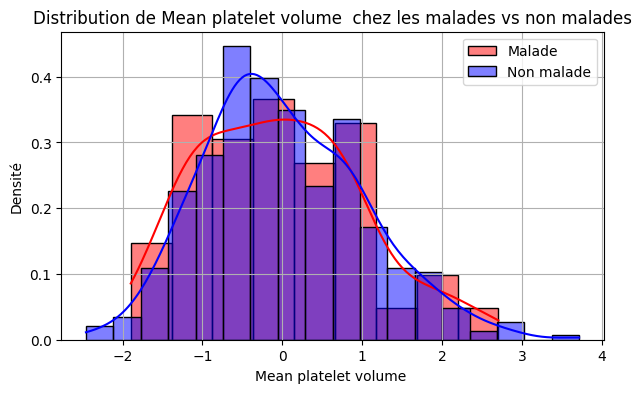

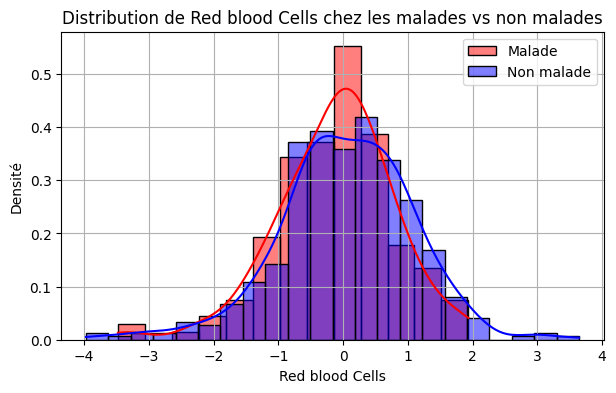

...

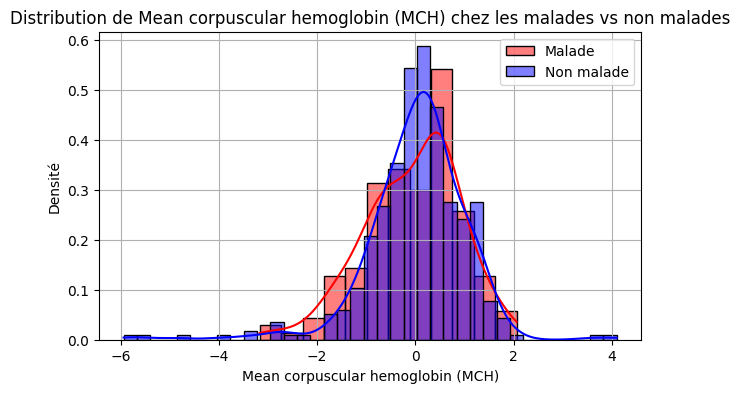

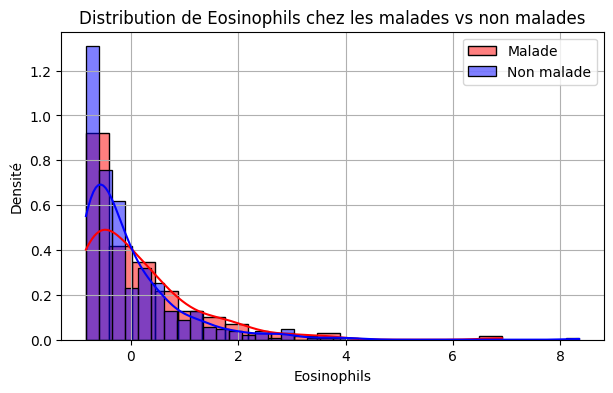

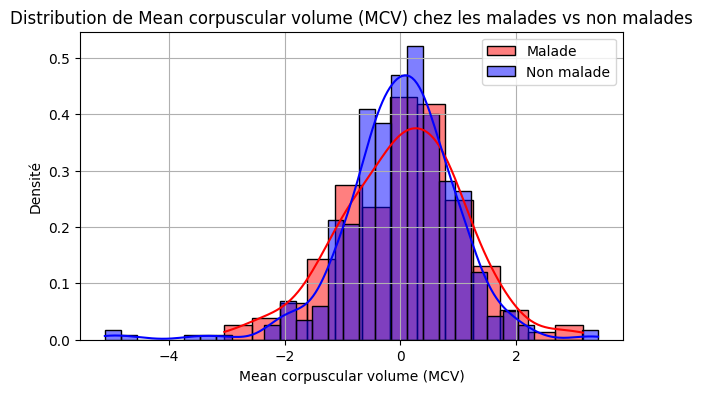

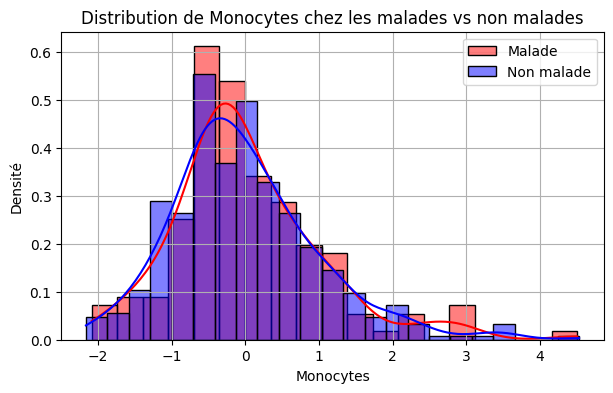

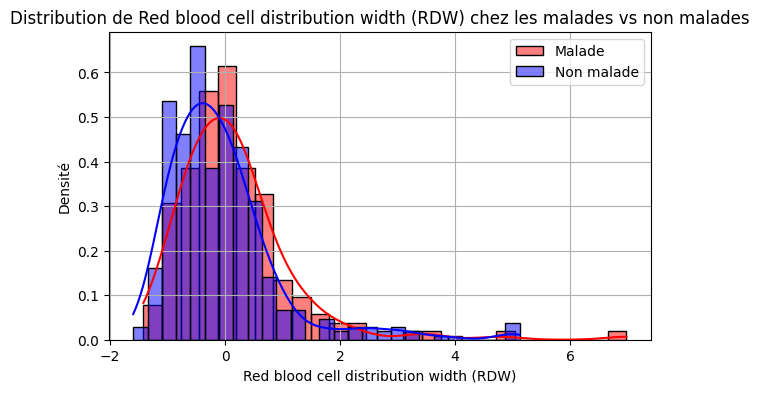

In [458]:
for col in blood_columns:
    plt.figure(figsize=(7, 4))
    
    sns.histplot(malade_df[col], kde=True, label='Malade', color='red', stat='density')
    sns.histplot(non_malade_df[col], kde=True, label='Non malade', color='blue', stat='density')
    
    plt.title(f"Distribution de {col} chez les malades vs non malades")
    plt.xlabel(col)
    plt.ylabel("Densité")
    plt.legend()
    plt.grid()
    plt.show()

 #### <font color = orange >**Distribution des variables biologiques : malades vs non malades**</font>
- Dans cette section, nous comparons la distribution de plusieurs variables sanguines entre les patients testés positifs (malades) et négatifs (non malades) au COVID-19. Les courbes de densité montrent que certaines caractéristiques biologiques, comme le taux d’hématocrite ou le nombre de leucocytes, varient sensiblement entre les deux groupes. Ces différences indiquent que certaines variables peuvent jouer un rôle important dans la distinction entre malades et non malades. Cette étape est essentielle pour identifier les facteurs biologiques les plus pertinents pour le diagnostic.


In [459]:
def hospitalisation(df):
    if df['Patient addmited to regular ward (1=yes, 0=no)'] == 1:
        return 'surveillance'
    elif df['Patient addmited to semi-intensive unit (1=yes, 0=no)'] == 1:
        return 'soins semi-intensifs'
    elif df['Patient addmited to intensive care unit (1=yes, 0=no)'] == 1:
        return 'soins intensifs'
    else:
        return 'inconnu'

# Application de la fonction
df['statut'] = df.apply(hospitalisation, axis=1)

#### <font color = orange >**Statut d’hospitalisation et analyse des variables biologiques**</font>


Afin de mieux comprendre l’impact du niveau d’hospitalisation sur les caractéristiques biologiques des patients, nous avons créé une nouvelle variable appelée statut. Cette variable regroupe les patients selon le type de soins reçus : surveillance, soins semi-intensifs, soins intensifs, ou inconnu. Pour cela, nous avons utilisé une fonction personnalisée (hospitalisation()) appliquée à chaque ligne du jeu de données.




C:\Users\4B\AppData\Local\Temp\ipykernel_8260\3478996593.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['statut'] == cat][col], label=cat)
C:\Users\4B\AppData\Local\Temp\ipykernel_8260\3478996593.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['statut'] == cat][col], label=c

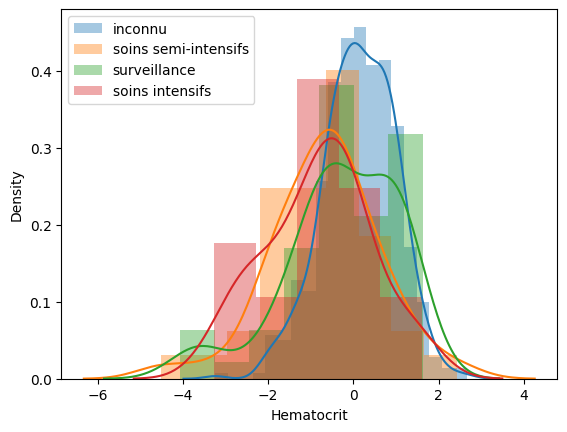

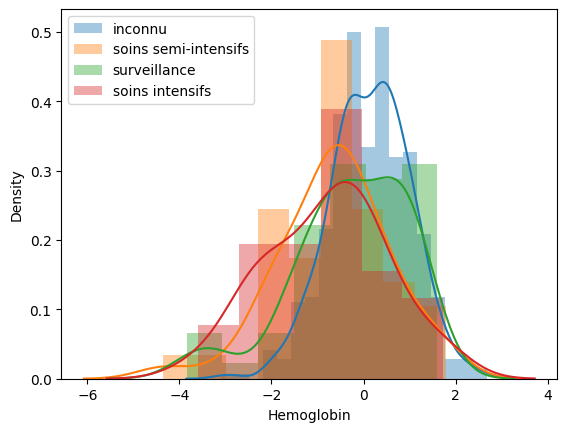

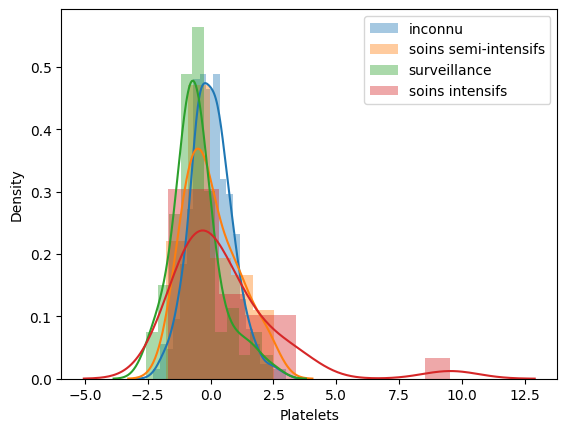

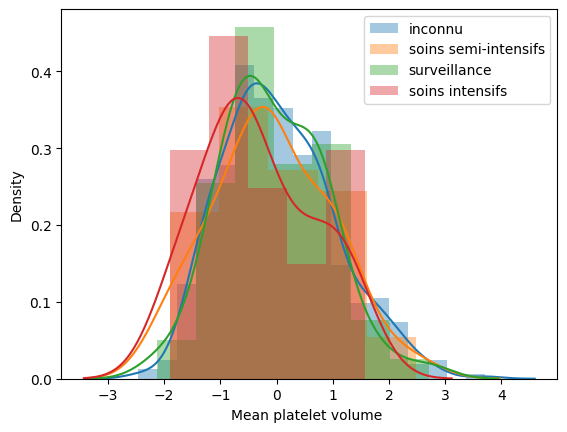

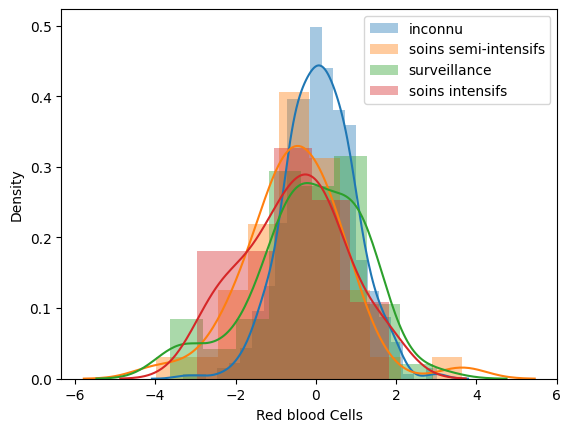

...

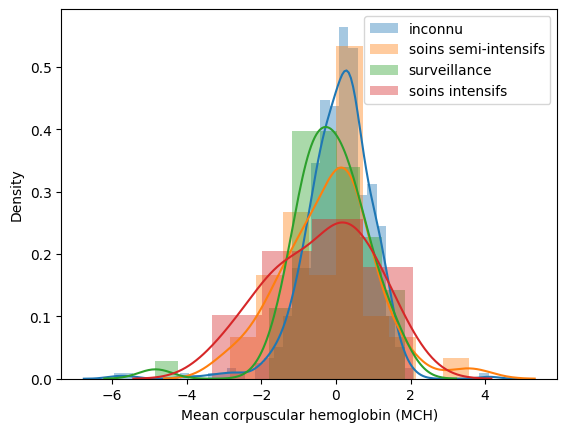

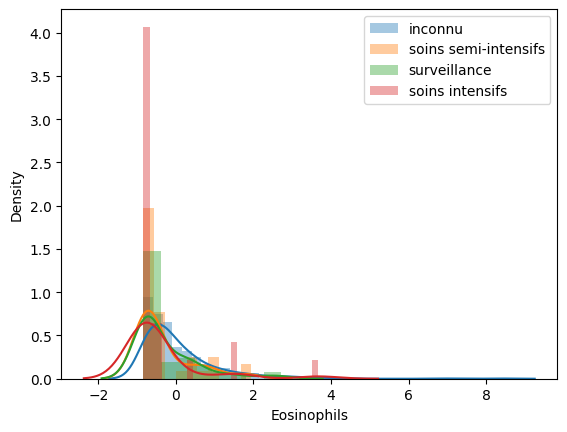

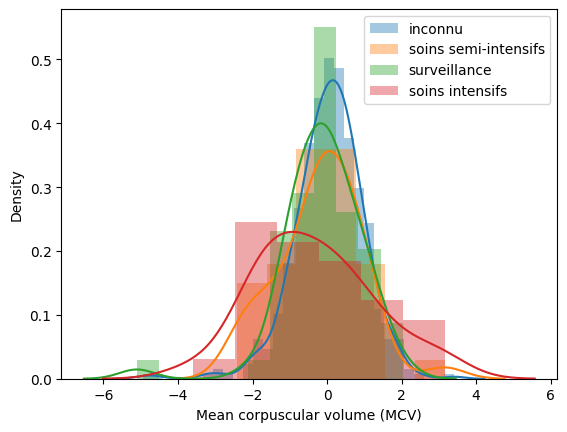

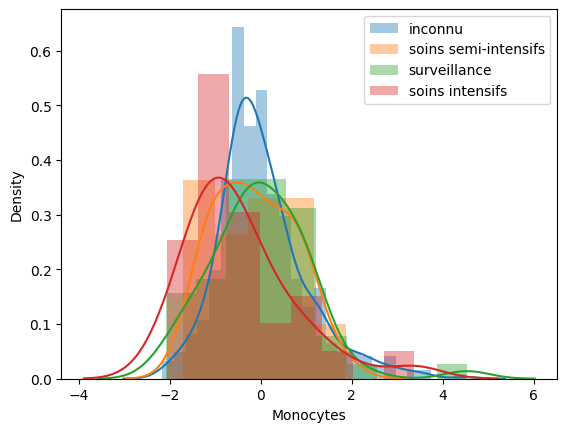

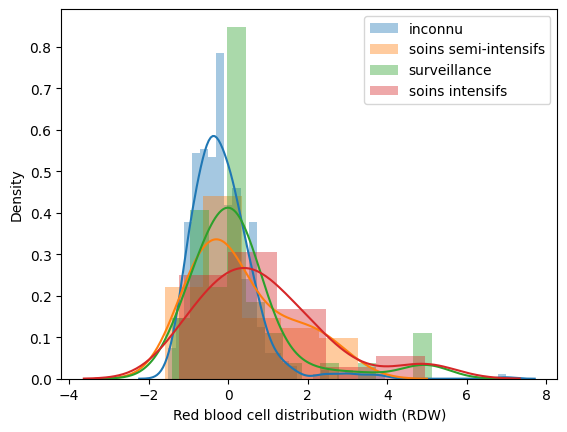

In [460]:
for col in blood_columns:
    plt.figure()
    for cat in df['statut'].unique():
        sns.distplot(df[df['statut'] == cat][col], label=cat)
    plt.legend()



#### <font color = orange >**Les courbes de distribution**</font>


Les courbes de distribution générées permettent ensuite de comparer, pour chaque variable sanguine, les différents niveaux d’hospitalisation. Ces visualisations montrent si certaines anomalies biologiques sont plus fréquentes chez les patients hospitalisés en soins intensifs, par exemple. Cela permet d’identifier des tendances cliniques associées à la gravité de l’état du patient, et de justifier la pertinence du regroupement par statut médical dans l’analyse.

In [461]:
df[blood_columns].count()

Hematocrit                                          603
Hemoglobin                                          603
Platelets                                           602
Mean platelet volume                                599
Red blood Cells                                     602
Lymphocytes                                         602
Mean corpuscular hemoglobin concentration (MCHC)    602
Leukocytes                                          602
Basophils                                           602
Mean corpuscular hemoglobin (MCH)                   602
Eosinophils                                         602
Mean corpuscular volume (MCV)                       602
Monocytes                                           601
Red blood cell distribution width (RDW)             602
dtype: int64

In [462]:
df[viral_columns].count()

Respiratory Syncytial Virus    1354
Influenza A                    1354
Influenza B                    1354
Parainfluenza 1                1352
CoronavirusNL63                1352
Rhinovirus/Enterovirus         1352
Coronavirus HKU1               1352
Parainfluenza 3                1352
Chlamydophila pneumoniae       1352
Adenovirus                     1352
Parainfluenza 4                1352
Coronavirus229E                1352
CoronavirusOC43                1352
Inf A H1N1 2009                1352
Bordetella pertussis           1352
Metapneumovirus                1352
Parainfluenza 2                1352
Influenza B, rapid test         820
Influenza A, rapid test         820
dtype: int64

In [463]:
df1 = df[viral_columns[:-2]]
df1['covid'] = df['SARS-Cov-2 exam result']
df1.dropna()['covid'].value_counts(normalize=True)

C:\Users\4B\AppData\Local\Temp\ipykernel_8260\3520532109.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['covid'] = df['SARS-Cov-2 exam result']


covid
negative    0.91716
positive    0.08284
Name: proportion, dtype: float64

In [464]:
df2 = df[blood_columns]
df2['covid'] = df['SARS-Cov-2 exam result']
df2.dropna()['covid'].value_counts(normalize=True)


C:\Users\4B\AppData\Local\Temp\ipykernel_8260\3680749685.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['covid'] = df['SARS-Cov-2 exam result']


covid
negative    0.864548
positive    0.135452
Name: proportion, dtype: float64

In [ ]:
from scipy.stats import ttest_ind


In [466]:
positive_df

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,...,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
67,78511c183ae18bc,7,positive,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
284,d7834ed75f2da44,16,positive,1,0,0,NaN,NaN,NaN,NaN,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
513,b16b49f7bd3e692,10,positive,0,0,0,NaN,NaN,NaN,NaN,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
568,4382f5ea05e60c4,2,positive,0,0,0,0.991838,0.792188,-0.341548,1.469188,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
676,d3729cd2658ca64,15,positive,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5632,5c386388ba3c3f0,16,positive,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5633,9f8dfe2ae239238,4,positive,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5634,db77903261ab6d0,15,positive,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5639,ae66feb9e4dc3a0,3,positive,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [468]:
balanced_neg = negative_df.sample(positive_df.shape[0])

#### <font color = orange >**Le but de ce test est de :**</font>

Déterminer si certaines variables biologiques présentent des différences significatives entre deux groupes de patients :
ceux positifs au COVID-19 (ou "malades") et ceux négatifs (ou "non malades").

#### <font color = orange >**Hypothèse:**</font>

H0 = les taux moyens sont égaux chez les individus positifs et négatifs.

In [469]:
def t_test(col):
    alpha = 0.02
    stat, p = ttest_ind(balanced_neg[col].dropna(), positive_df[col].dropna())
    if p < alpha:
        return 'H0 Rejetée'
    else :
        return 0

In [470]:
for col in blood_columns:
    print(f'{col :-<50} {t_test(col)}')

Hematocrit---------------------------------------- 0
Hemoglobin---------------------------------------- 0
Platelets----------------------------------------- H0 Rejetée
Mean platelet volume ----------------------------- 0
Red blood Cells----------------------------------- 0
Lymphocytes--------------------------------------- 0
Mean corpuscular hemoglobin concentration (MCHC)-- 0
Leukocytes---------------------------------------- H0 Rejetée
Basophils----------------------------------------- 0
Mean corpuscular hemoglobin (MCH)----------------- 0
Eosinophils--------------------------------------- H0 Rejetée
Mean corpuscular volume (MCV)--------------------- 0
Monocytes----------------------------------------- H0 Rejetée
Red blood cell distribution width (RDW)----------- 0


#### <font color = orange >**Interprétation :**</font>

Si la p-value < α = 0.02 →

➤ On rejette H₀ ➝ la variable diffère significativement entre les deux groupes.

➤ Elle est donc potentiellement utile pour différencier les patients COVID+ des COVID−.

Si p-value ≥ α →

➤ On ne peut pas prouver qu'il existe une vraie différence.

## <font color = red>                        **Conclusion Générale:**





Dans ce projet d’Analyse Exploratoire des Données (EDA), nous avons examiné un ensemble de données médicales réelles liées au COVID-19 dans le but de répondre à une question centrale : quelles sont les caractéristiques cliniques, biologiques et virales les plus déterminantes pour distinguer les patients positifs de ceux testés négatifs, et identifier les profils les plus à risque ?

L’analyse a mis en évidence plusieurs variables clés dans la différenciation des cas : des indicateurs cliniques tels que la fièvre, la toux, et des difficultés respiratoires, mais aussi des marqueurs biologiques comme la saturation en oxygène, la numération des globules blancs ou le taux de CRP. Ces facteurs se sont révélés plus fréquents ou plus prononcés chez les patients positifs, suggérant leur valeur discriminante pour le diagnostic.

L’approche exploratoire a aussi permis de dresser des profils types de patients à risque, notamment les personnes âgées, celles souffrant de maladies chroniques (comme le diabète ou les maladies cardiovasculaires), ou encore celles présentant des symptômes sévères dès l’admission. Ces résultats, obtenus grâce à la visualisation de données, la détection de corrélations et l’interprétation clinique, offrent une meilleure compréhension de l'évolution de la maladie selon les profils individuels.

Enfin, cette étude constitue une base solide pour des travaux de modélisation prédictive, en vue de développer des outils d’aide à la décision médicale. Elle démontre également l’importance de l’analyse de données dans le domaine de la santé publique, en permettant d’identifier rapidement les facteurs critiques dans une situation d’urgence sanitaire.
